# hdf5

In [1]:
import h5py
import numpy as np
import pandas as pd


In [2]:
#Los Archivos hdf5 funcionan como diccionario y se pueden ispeccionar con keys
h5_vel = h5py.File("../data/c_1/geo_velocity.h5")
h5_vel.keys()

<KeysViewHDF5 ['velocity', 'velocityStd']>

In [3]:
h5_vel["velocity"]

<HDF5 dataset "velocity": shape (1327, 1069), type "<f4">

In [4]:
#Los atributos contienen metadatos
h5_vel["velocity"].attrs.keys()

<KeysViewHDF5 []>

In [5]:
h5_vel.attrs.keys()

<KeysViewHDF5 ['ALOOKS', 'ANTENNA_SIDE', 'AZIMUTH_PIXEL_SIZE', 'BANDS', 'CENTER_INCIDENCE_ANGLE', 'CENTER_LINE_UTC', 'DATA_TYPE', 'DATE12', 'EARTH_RADIUS', 'END_DATE', 'FILE_LENGTH', 'FILE_PATH', 'FILE_TYPE', 'HEADING', 'HEIGHT', 'INTERLEAVE', 'ISCE_VERSION', 'LAT_REF1', 'LAT_REF2', 'LAT_REF3', 'LAT_REF4', 'LENGTH', 'LON_REF1', 'LON_REF2', 'LON_REF3', 'LON_REF4', 'NCORRLOOKS', 'OG_FILE_PATH', 'ORBIT_DIRECTION', 'PLATFORM', 'POLARIZATION', 'PRF', 'PROCESSOR', 'PROJECT_NAME', 'P_BASELINE_BOTTOM_HDR', 'P_BASELINE_TOP_HDR', 'RANGE_PIXEL_SIZE', 'REF_DATE', 'REF_LAT', 'REF_LON', 'REF_X', 'REF_Y', 'RLOOKS', 'STARTING_RANGE', 'START_DATE', 'UNIT', 'WAVELENGTH', 'WIDTH', 'X_FIRST', 'X_STEP', 'X_UNIT', 'Y_FIRST', 'Y_STEP', 'Y_UNIT', 'access_mode', 'altitude', 'azimuthPixelSize', 'azimuthResolution', 'beam_mode', 'beam_swath', 'byte_order', 'data_type', 'earthRadius', 'family', 'file_name', 'firstFrameNumber', 'first_frame', 'image_type', 'lastFrameNumber', 'last_frame', 'length', 'mintpy.compute

In [6]:
h5_coh = h5py.File("../data/c_1/geo_temporalCoherence.h5")

Convertimos los archivos hdf5 a objetos numpy

In [7]:
c1 = np.asarray(h5py.File("../data/c_1/geo_velocity.h5")["velocity"])
c2 = np.asarray(h5py.File("../data/c_2/geo_velocity.h5")["velocity"])
c3 = np.asarray(h5py.File("../data/c_3/geo_velocity.h5")["velocity"])

nan1= np.isnan(c1)
nan2= np.isnan(c2)
nan3= np.isnan(c3)

c1 = np.where(nan1, 0, c1)
c2 = np.where(nan2, 0, c2)
c3 = np.where(nan3, 0, c3)

In [8]:
coh1 = np.asarray(h5py.File("../data/c_1/geo_temporalCoherence.h5")["temporalCoherence"])
coh2 = np.asarray(h5py.File("../data/c_2/geo_temporalCoherence.h5")["temporalCoherence"])
coh3 = np.asarray(h5py.File("../data/c_3/geo_temporalCoherence.h5")["temporalCoherence"])

coh1 = np.where(np.isnan(coh1), 0, coh1)
coh2 = np.where(np.isnan(coh2), 0, coh2)
coh3 = np.where(np.isnan(coh3), 0, coh3)

In [9]:
print(c1.shape)
print(c2.shape)
print(c3.shape)

(1327, 1069)
(1327, 1069)
(1327, 1069)


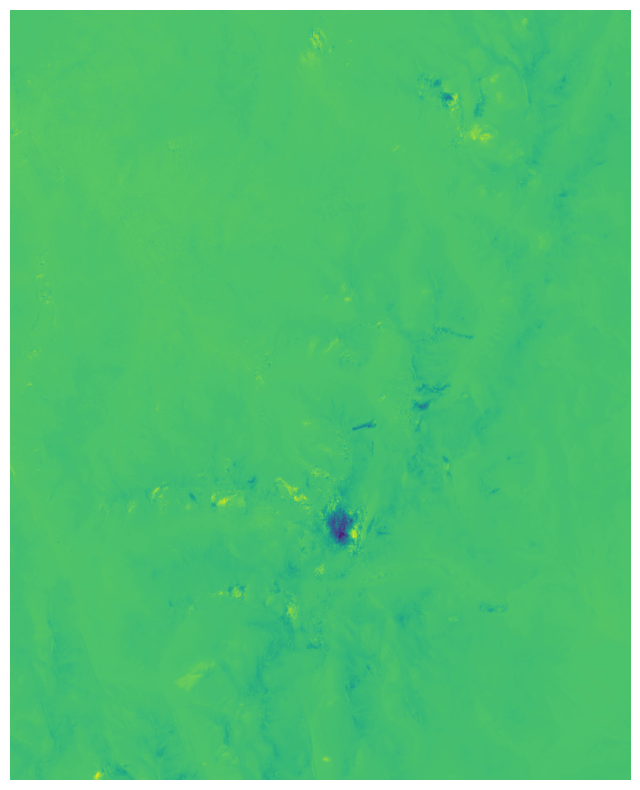

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.axis("off")
plt.imshow(c3)

Ojo que en esta escala no se diferencian los valores negativos de los positivos

# Georreferencia

Cada medición (c_1, c_2, c_3) tiene su respectivo `extent`, que contiene las coordenadas de las esquinas de la matriz, necesarias para relacionarla con los polígonos

In [15]:
extent1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_1/extent.tsv", sep="\t", header=None).to_numpy()
extent2 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_2/extent.tsv", sep="\t", header=None).to_numpy()
extent3 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_3/extent.tsv", sep="\t", header=None).to_numpy()

In [16]:
extent1

array([[-28.11996841, -69.82037354],
       [-28.11996841, -69.42983246],
       [-28.52018356, -69.82037354],
       [-28.52018356, -69.42983246]])

Tamaño (en coordenadas) del área

In [17]:
extent1[0,0] - extent1[2,0]

0.4002151500000011

In [18]:
extent1[0,1] - extent1[1,1]

-0.39054108000000554

# Detección de polígonos

Esta función permite detectar los puntos que están dentro de un polígono mediante triangulación, para lo cual se crea una función para detectar los puntos que están en un triángulo

In [19]:
#Función que detecta cuando un punto o puntos están en un triángulo.
def in_triangle(points, triangle):
    t1, t2, t3 = triangle
    p = points.reshape(-1, 2)
    ret = []
    
    #Tomar 2 pares de vértices (ta, tb) y ver si point y el otro vértice tr están al mismo lado de la recta que forma ta, tb
    for ta, tb, tr in [(t1, t2, t3), (t1, t3, t2), (t2, t3, t1)]:
        ortog = (tb-ta) @ np.array([[0, -1], [1, 0]])
        ret.append(((tr - 0.5*(ta+tb)) @ ortog) * ((points - 0.5*(ta+tb)) @ ortog) >= 0)
    return np.all(ret, axis=0)

#Toma 3 puntos secuenciales y mediante producto punto evalúa el ángulo de giro (con signo) entre el vector p2-p1 y p3-p2
def turn(triang):
    v1 = triang[1]-triang[0]
    v2 = triang[2]-triang[1]
    ang = np.arccos(v1@v2/(np.linalg.norm(v1)*np.linalg.norm(v2)))/(2*np.pi)
    sign = v1[0]*v2[1] - v1[1]*v2[0]
    return ang*sign/abs(sign)

#Método de triangulación para determinar si un punto o puntos están en el polígono
def in_polygon(points, polygon, verbose=False):
    #Order representa los puntos que actualmente están en el polígono, los cuales se irán descartando en un proceso iterativo
    order = list(range(len(polygon)))
    
    #La suma de los ángulos de giro de todo polígono sin intersecciones es 2pi o -2pi. Lo calculamos para detectar concavidad
    angle = sum(turn(polygon[(order*2)[t: t+3]]) for t in range(len(order)))
    ret = []
    while len(order)>= 3:
        print(f"Computando triángulo {len(polygon)-len(order)+1} de {len(polygon)-2}") if verbose else None
        nowlen=len(order) #Para evitar loops infinitos, se arroja un error cuando no se descarta un punto en un ciclo
        
        for t in range(len(order)):
            #En un ciclo se evalúan todos los triángulos formados por 3 vértices consecutivos
            tri = polygon[(order*2)[t: t+3]]
            
            #El triángulo es válido si el ángulo de giro es del mismo signo que el del polígono y si no contiene otros vértices
            if turn(tri)*angle > 0 and np.sum(in_triangle(polygon[(2*order)[t+3:t+len(order)]], tri))==0:
                #Se evalúan los puntos si pertenecen al triángulo, se descarta el vértice central y se repite el ciclo
                ret.append(in_triangle(points, tri))
                order.remove((2*order)[t+1])
                break
        if len(order)==nowlen: 
            print(polygon[order])
            raise Exception("Error en el ciclo!")
    
    #Puntos que pertenecen a cualquiera de los triángulos son considerados dentro del polígono
    return np.any(ret, 0)
            

Probamos la función con un polígono custom y datos random

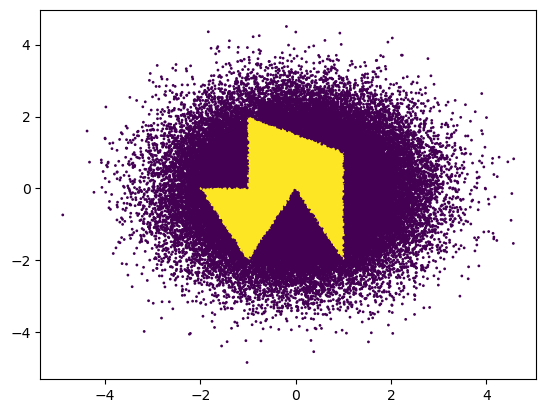

In [20]:
np.random.seed(1991)
points = np.random.randn(100000, 2)*1.1

intriangles = in_polygon(points, np.array([[1,1], [-1,2], [-1,0], [-2,0], [-1,-2], [0,0], [1,-2]]))

plt.scatter(points[:,0], points[:,1], c = intriangles, s=1)

La función matrix_polygon permite asignar un extent a un shape de una matriz para luego mediante la función de triangulación de un polígono detectar cuales casillas están dentro del polígono. La probamos con datos dummy y un polígono dummy

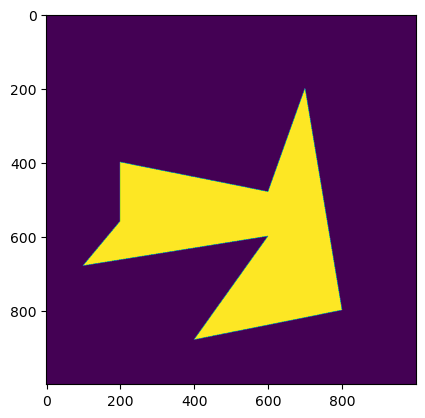

In [21]:
def matrix_polygon(shape, extent, polygon, verbose=False, lower_up=False):
    #Normalizo minmax para evitar en lo posible errores numéricos cuando los triángulos tienen formas muy bizarras
    mean, var = np.mean(extent, axis=0), 100/(np.max(extent, axis=0)- np.min(extent, axis=0))
    extent, polygon = (var*(np.array(extent)-mean)), var*(np.array(polygon)-mean)
    
    def midspace(c1, c2, size):
        lins = np.linspace(c1, c2, size+1)
        return np.mean((lins[1:], lins[:-1]), axis=0)
    side1 = midspace(extent[0], extent[2], shape[0])
    side2 = midspace(extent[1], extent[3], shape[0])
    points = np.concatenate([midspace(s1, s2, shape[1]) for s1, s2 in zip(side1, side2)])
    matrix = in_polygon(points, polygon, verbose=verbose)
    return matrix.reshape(shape)

ext = sq = np.array([
    [ 50,-20],
    [ 50,-15],
    [ 75,-20],
    [ 75,-15]
])
matrix = matrix_polygon(shape = (1000, 1000), extent =ext, polygon = np.array([[60,-19], [62,-17], 
                                        [55, -16.5], [70,-16], [72, -18], [65,-17], [67, -19.5], [64, -19]]))

plt.imshow(matrix)

# Glaciares

Cargamos los glaciares mediante pandas. Estos son pares de coordenadas donde el último punto está repetido (cerrado). lo eliminamos y damos vuelta las coordenadas (de formato x,y a formato filas, columnas)

In [22]:
import pandas as pd
glaciar_1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_1_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_2 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_2_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_3 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_3_strict.tsv", sep="\t", header=None).to_numpy()[:-1]

glaciar_1 = glaciar_1[:,[1,0]]
glaciar_2 = glaciar_2[:,[1,0]]
glaciar_3 = glaciar_3[:,[1,0]]

Utilizamos nuestra función con el shape de la matriz de velocidad y los polígonos de los glaciares. Como son tantos datos, utilizamos verbose.

In [23]:
en_glaciar_1 = matrix_polygon(c1.shape, extent1, glaciar_1, verbose=True)

Computando triángulo 1 de 17
Computando triángulo 2 de 17
Computando triángulo 3 de 17
Computando triángulo 4 de 17
Computando triángulo 5 de 17
Computando triángulo 6 de 17
Computando triángulo 7 de 17
Computando triángulo 8 de 17
Computando triángulo 9 de 17
Computando triángulo 10 de 17
Computando triángulo 11 de 17
Computando triángulo 12 de 17
Computando triángulo 13 de 17
Computando triángulo 14 de 17
Computando triángulo 15 de 17
Computando triángulo 16 de 17
Computando triángulo 17 de 17


In [24]:
en_glaciar_2 = matrix_polygon(c1.shape, extent1, glaciar_2, verbose=True)

Computando triángulo 1 de 26
Computando triángulo 2 de 26
Computando triángulo 3 de 26
Computando triángulo 4 de 26
Computando triángulo 5 de 26
Computando triángulo 6 de 26
Computando triángulo 7 de 26
Computando triángulo 8 de 26
Computando triángulo 9 de 26
Computando triángulo 10 de 26
Computando triángulo 11 de 26
Computando triángulo 12 de 26
Computando triángulo 13 de 26
Computando triángulo 14 de 26
Computando triángulo 15 de 26
Computando triángulo 16 de 26
Computando triángulo 17 de 26
Computando triángulo 18 de 26
Computando triángulo 19 de 26
Computando triángulo 20 de 26
Computando triángulo 21 de 26
Computando triángulo 22 de 26
Computando triángulo 23 de 26
Computando triángulo 24 de 26
Computando triángulo 25 de 26
Computando triángulo 26 de 26


In [25]:
en_glaciar_3 = matrix_polygon(c1.shape, extent1, glaciar_3, verbose=True)

Computando triángulo 1 de 25
Computando triángulo 2 de 25
Computando triángulo 3 de 25
Computando triángulo 4 de 25
Computando triángulo 5 de 25
Computando triángulo 6 de 25
Computando triángulo 7 de 25
Computando triángulo 8 de 25
Computando triángulo 9 de 25
Computando triángulo 10 de 25
Computando triángulo 11 de 25
Computando triángulo 12 de 25
Computando triángulo 13 de 25
Computando triángulo 14 de 25
Computando triángulo 15 de 25
Computando triángulo 16 de 25
Computando triángulo 17 de 25
Computando triángulo 18 de 25
Computando triángulo 19 de 25
Computando triángulo 20 de 25
Computando triángulo 21 de 25
Computando triángulo 22 de 25
Computando triángulo 23 de 25
Computando triángulo 24 de 25
Computando triángulo 25 de 25


Luego fusionamos las 3 matrices para obtener una sóla matriz que es True para las casillas que están dentro de cualquiera de los 3 glaciares

In [26]:
en_glaciares = np.any((en_glaciar_1, en_glaciar_2, en_glaciar_3), axis=0)
np.save("en_glaciar_h5", en_glaciares)

Como el extent del glaciar 3 es distinto, realizamos el mismo proceso para el glaciar 3.

In [23]:
#en_glaciar_1 = matrix_polygon(c1.shape, extent3, glaciar_1)

In [24]:
#en_glaciar_2 = matrix_polygon(c1.shape, extent3, glaciar_2)

In [25]:
#en_glaciar_3 = matrix_polygon(c1.shape, extent3, glaciar_3)

In [26]:
#en_glaciares3 = np.any((en_glaciar_1, en_glaciar_2, en_glaciar_3), axis=0)

In [27]:
np.sum(en_glaciares)

1947

# Visualización

Primero, crearemos nuestros colormaps para ver los datos de forma más adecuada. alpha y glow son colormaps transparentes para poder ver más de una matriz en el mismo imshow. Fluor es una matriz divergente (Como "PiYG") para destacar valores negativos y positivos.

In [51]:
from matplotlib.colors import LinearSegmentedColormap

def create_colormap(colors, docks, name=""):
    cmap = np.zeros((256, 4))
    points = np.linspace(0, 1, 256)
    colors = np.array(colors)
    for i in range(1, len(colors)):
        condition = np.all((points >= docks[i-1], points<= docks[i]), axis=0)
        cmap[condition] =  colors[i-1] + (points[condition]-docks[i-1]).reshape(-1, 1) * (colors[i]- colors[i-1])
    return LinearSegmentedColormap.from_list(name = name, colors=cmap)

colors = np.column_stack((np.ones((256, 3)), np.linspace(0, 1, 256)))
alpha = LinearSegmentedColormap.from_list(name = "alpha", colors=colors)
glow = LinearSegmentedColormap.from_list(name = "glow", colors=colors*np.array([0.97, 0.58, 0.2, 1]))
danger = LinearSegmentedColormap.from_list(name = "danger", colors=colors*np.array([0.85, 0.2, 0.45, 1]))
sky = LinearSegmentedColormap.from_list(name = "sky", colors=colors*np.array([0.25, 0.45, 0.95, 1]))

colors2 = np.array([[0, .95, 1,1], [0,0,0,1], [.75,.9,0,1]])
fluor = LinearSegmentedColormap.from_list(name = "fluor", colors=colors2)

La clase "mapper" automatiza todas las transformaciones tediosas de coordenadas para permitir visualizar en el mismo imshow tanto polígonos como matrices, con diferentes cmaps. Con subset se puede hacer zoom y con center_scale se puede fijar que el centro del colormap sea en 0. Incluye la posibilidad de dibujar mapas no rectangulares con el sistema de 4 coordenadas. De ser así, realiza los cálculos al inicializar la clase para que las transformaciones sean rápidas.

In [19]:
class mapper:
    def __init__(self, extent, shape):
        self.extent=extent
        self.shape = shape
        self.rect = False
        if extent[0,0]-extent[2,0] == extent[1,0]-extent[3,0] and extent[0,0]-extent[1,0] == extent[2,0]-extent[3,0]:
            self.rect = True
            self.extent = np.array([[extent[0,0], extent[3,0]], [extent[0,1], extent[1,1]]])
        else:
            def midspace(c1, c2, size):
                lins = np.linspace(c1, c2, size+1)
                return np.mean((lins[1:], lins[:-1]), axis=0)
            side1 = midspace(extent[0], extent[2], shape[0])
            side2 = midspace(extent[1], extent[3], shape[0])
            points = np.concatenate([midspace(s1, s2, shape[1]) for s1, s2 in zip(side1, side2)])
            new_extent = np.array([[np.max(extent[:,0]), np.min(extent[:,0])], [np.min(extent[:,1]), np.max(extent[:,1])]])
            step_0 = (new_extent[0, 1] - new_extent[0, 0])/shape[0]
            step_1 = (new_extent[1, 1] - new_extent[1, 0])/shape[1]

            cords = np.column_stack(((points[:,0] - new_extent[0,0])//step_0, 
                                     (points[:,1] - new_extent[1,0])//step_1))
            all_cords = np.array([cords] + [cords + np.array([i, j]) for i in range(-1,2) for j in range(-1,2) if (i, j) != (0,0)])

            weights = np.exp(- np.linalg.norm((points - np.array([new_extent[0, 0], new_extent[1, 0]]) 
                             - np.array([step_0, step_1])/2)/np.array([step_0, step_1]) - all_cords  , axis=2)**2).T.flatten()

            cords = (np.clip(all_cords[:, :, 0], 0, shape[0]-1)*shape[1] + np.clip(all_cords[:, :, 1], 
                                                                                   0, shape[1]-1)).T.flatten().astype(int)
            index = np.repeat(np.arange(points.shape[0]), 9).astype(int)
            weight_order = np.argsort(weights)

            self.index  = index[weight_order]
            self.cords = cords[weight_order]
            self.extent = new_extent

    def project(self, mp):
        if self.rect:
            return mp
        else:
            ret = np.zeros(self.shape[0] * self.shape[1])
            ret[self.cords] = mp.flatten()[self.index]
            return ret.reshape(self.shape)
    def draw(self, maps=[], glaciares=[], cmaps="viridis", linewidth=1.5, linecol="white", figsize=(8, 8),
             subset=[[0,1], [0,1]], center_scale = False, colorbar=False):
        maps, glaciares, cmaps, center_scale = [v if type(v) == list else [v] for v in [maps, glaciares, cmaps, center_scale]]
        maps = [self.project(mp) for mp in maps]
        subset = (np.array(self.shape).reshape(-1, 1)*np.array(subset)).astype(int)
        imshow_extent = self.extent[:,:1]  +  (self.extent[:,1:]-self.extent[:,:1]) * subset/np.array(self.shape).reshape(-1, 1)
        imshow_extent = np.concatenate((imshow_extent[1], np.flip(imshow_extent[0])))
        glaciares = [np.concatenate((glaciar, [glaciar[0]])) for glaciar in glaciares]
        plt.figure(figsize=figsize)
        for i, mp in enumerate(maps):
            img = mp[subset[0][0]:subset[0][1], subset[1][0]:subset[1][1]]
            if center_scale[i % len(center_scale)]:
                img = np.where(img>0, img/np.max(img), -img/np.min(img))
            plt.imshow(img, extent = imshow_extent, cmap = cmaps[i % len(cmaps)])
            if colorbar is i:
                plt.colorbar()
        for glaciar in glaciares:
            plt.plot(glaciar[:,1], glaciar[:,0], color=linecol, linewidth=linewidth)


mapper1 = mapper(extent1, c1.shape)
mapper3 = mapper(extent3, c3.shape)

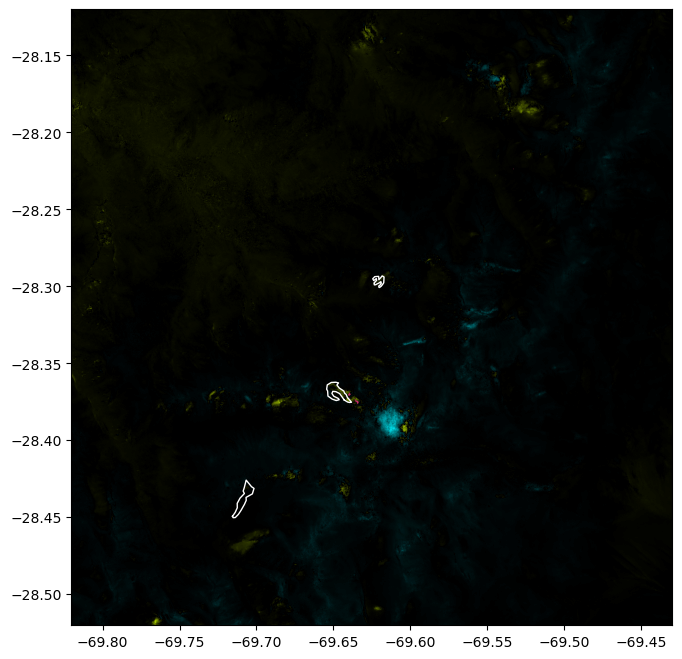

In [449]:
mapper3.draw([c3, -(coh3*np.logical_not(nan3))], cmaps=[fluor, danger], center_scale=[True, False],
          glaciares = [glaciar_1, glaciar_2, glaciar_3], linewidth=1)

Lo mismo pero marcando los pixeles de los glaciares 

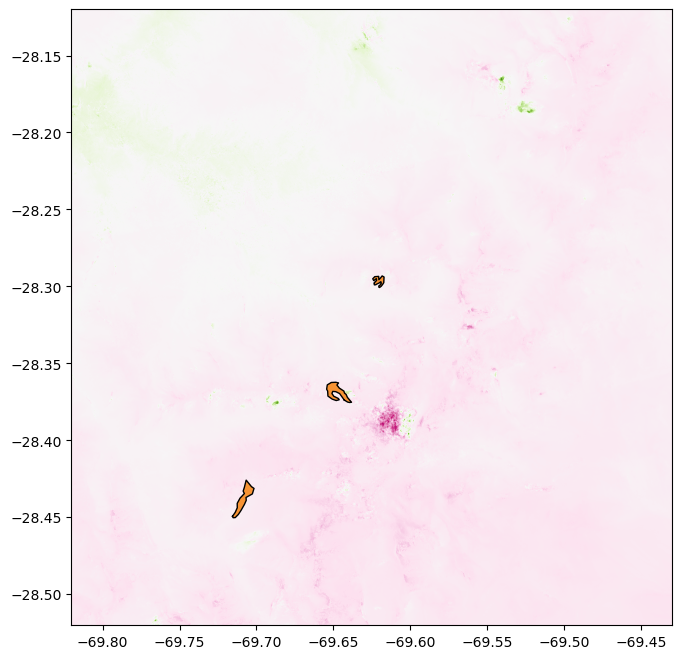

In [450]:
mapper1.draw([c1, en_glaciares], cmaps=["PiYG", glow], glaciares = [glaciar_1, glaciar_2, glaciar_3],
          center_scale=[True, False], linewidth=1, linecol="black")

Zoom a cada glaciar

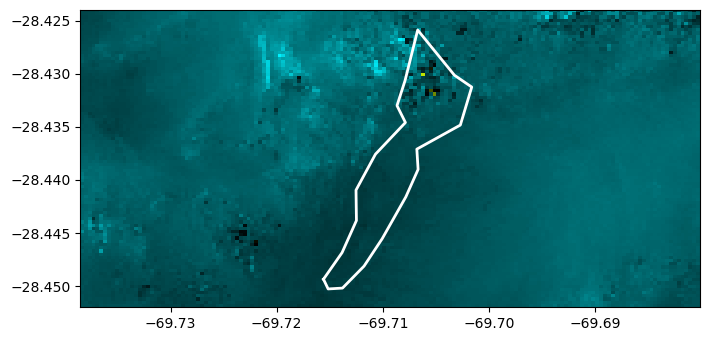

In [454]:
mapper1.draw(c1, center_scale=True, glaciares = glaciar_1, cmaps=fluor, linewidth=2,
          linecol="white", subset=[[.76, .83], [.21, .36]])

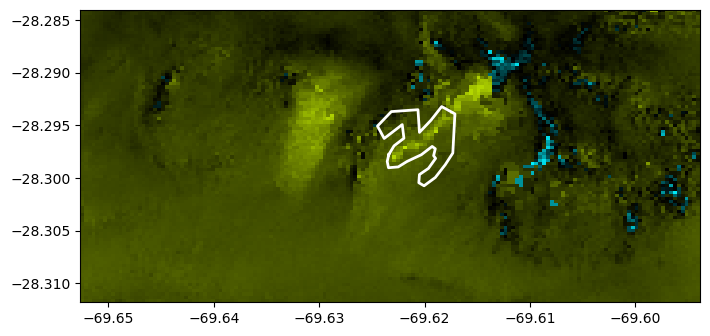

In [455]:
mapper1.draw(c2, glaciares = glaciar_2, cmaps=fluor, center_scale=True, linewidth=2, 
          linecol="white", subset=[[.41, .48], [.43, .58]])

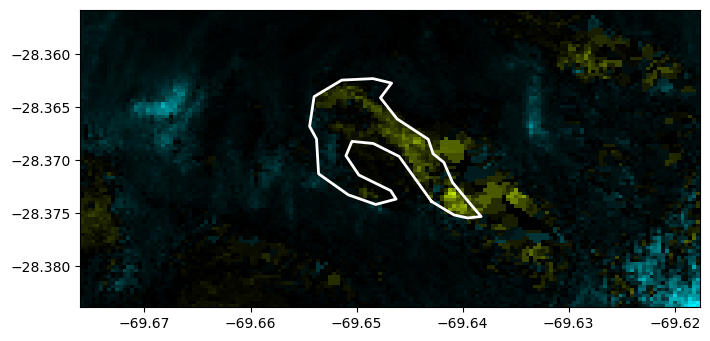

In [460]:
mapper1.draw(c3, linewidth=2, glaciares = glaciar_3, cmaps=fluor, center_scale=True,
          linecol="white", subset=[[.59, .66], [.37, .52]])

Ver cómo calza el polígono con los pixeles marcados

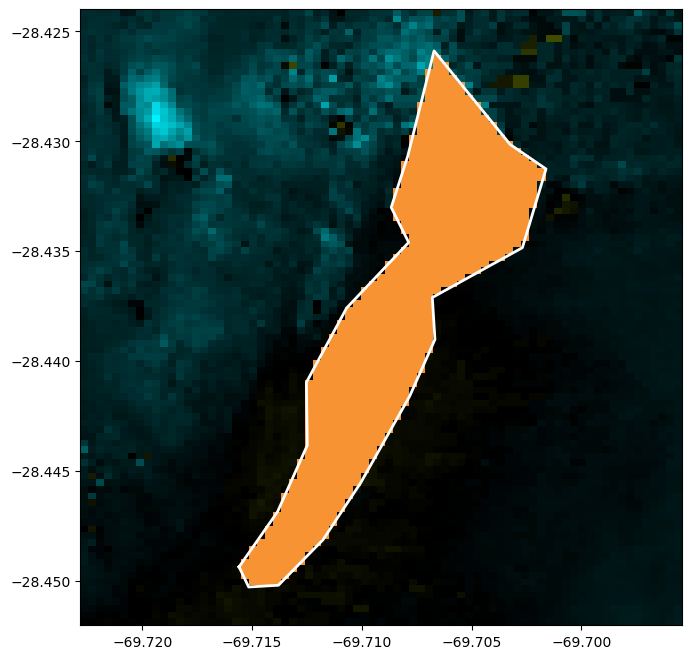

In [477]:
mapper3.draw([c3, en_glaciares], center_scale=[True, False], cmaps=[fluor, glow], glaciares = glaciar_1, 
          linewidth=2, subset=[[.76, .83], [.25, .32]])

Una muestra de cómo maneja geometrías no rectangulares

In [569]:
extent_deforme = np.array([
    [1, 5],
    [4, 3],
    [2, 2],
    [3, 1]
])

mapper_d = mapper(extent_deforme, c1.shape)

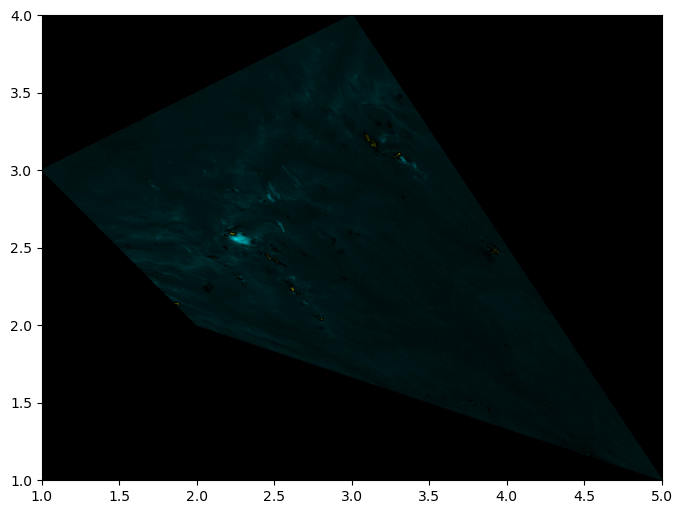

In [609]:
mapper_d.draw(c3-.01, cmaps = fluor, center_scale=True)

# EDA

Intento de EDA visualizando correlación local entre pixeles cercanos. Parte no terminada ni comentada

### Kernel local

In [478]:
def substract_correlation(matrix, shape):
    X, Y = matrix.shape
    I, J = shape
    ret = []
    for i in range(-I, I+1):
        for j in range(-J, J+1):
            ret.append( (matrix[I:-I,J:-J]-matrix[I+i:X-I+i,J+j:Y-J+j]) * matrix[I:-I,J:-J] )
    corrs = np.sum(np.array(ret), axis=0)
    return corrs
    
vel_subc = substract_correlation(c3, (5, 5))

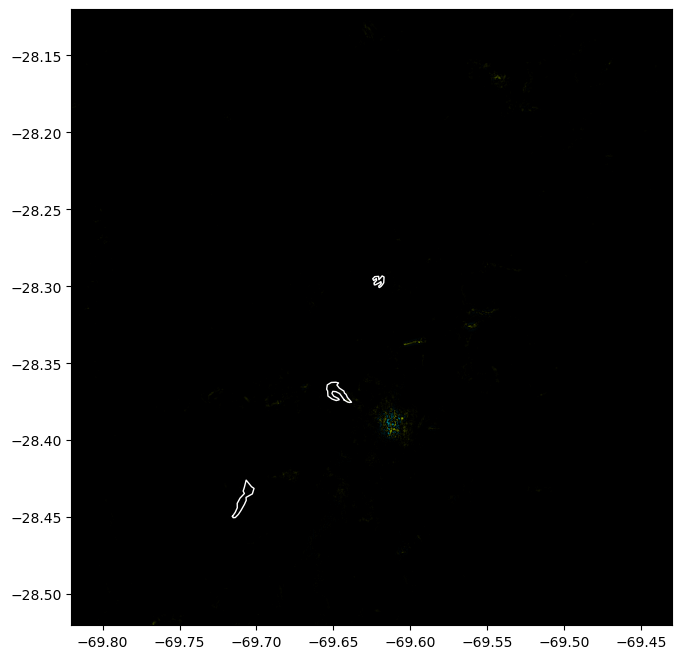

In [482]:
mapper3.draw(vel_subc, cmaps=fluor, center_scale=True, glaciares = [glaciar_1, glaciar_2, glaciar_3], linewidth=1)

### Distribución de velocidades

In [488]:
def density(X, data, sigma_scale = .1, cap = 10000):
    sigma = np.std(data) * sigma_scale
    data = np.random.choice(data, cap, replace=False) if len(data)>cap else data
    return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)

X = np.linspace(-.025, .025, 1000)
vel_notgla = density(X, c3.flatten()[np.logical_not(en_glaciares).flatten()], sigma_scale=.05)
vel_gla    = density(X, c3.flatten()[en_glaciares.flatten()], sigma_scale=.1)

Text(0, 0.5, 'Densidad relativa')

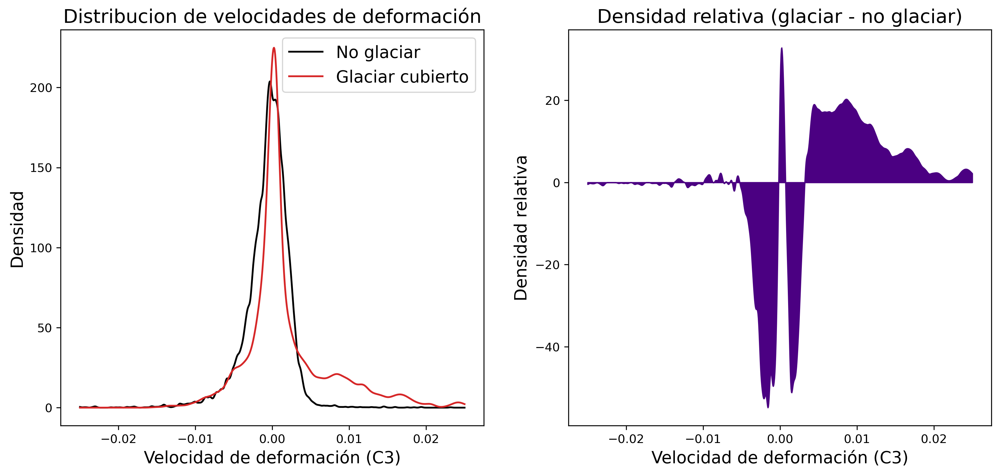

In [489]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
ax1, ax2 = axes
ax1.plot(X, vel_notgla, color="black", label="No glaciar")
ax1.plot(X, vel_gla, color="tab:red", label="Glaciar cubierto")
ax1.set_title("Distribucion de velocidades de deformación", size=16)
ax1.set_xlabel("Velocidad de deformación (C3)", size=14)
ax1.set_ylabel("Densidad", size=14)
ax1.legend(prop={"size":14})

ax2.fill_between(X, vel_gla-vel_notgla, color="indigo")
ax2.set_title("Densidad relativa (glaciar - no glaciar)", size=16)
ax2.set_xlabel("Velocidad de deformación (C3)", size=14)
ax2.set_ylabel("Densidad relativa", size=14)

### Diferencia contigua

In [29]:
def convolution_hist(matrix, ks=1, cov=False, norm=False, self=False, consider= None):
    ret = []
    I, J = matrix.shape
    if consider is None:
        consider = np.full(matrix.shape, True)

    consider = consider[ks:-ks, ks:-ks].flatten()
    
    for i in range(-ks, ks+1):
        for j in range(-ks, ks+1):
            if (i, j) == (0, 0) and self:
                ret.append(matrix[ks:-ks, ks:-ks].flatten()[consider])
            else:
                ret.append((matrix[ks:-ks, ks:-ks]-matrix[ks+i:I-ks+i, ks+j:J-ks+j]).flatten()[consider])

    if cov:
        mean = np.mean(matrix) if norm else 0
        for i in range(-ks, ks+1):
            for j in range(-ks, ks+1):
                ret.append(((matrix[ks:-ks, ks:-ks]-mean) * (matrix[ks+i:I-ks+i, ks+j:J-ks+j] - mean)).flatten()[consider])
    
    return ret

ks=1

vels_notgla = convolution_hist(c3, ks=ks, consider = np.logical_not(en_glaciares))
vels_gla    = convolution_hist(c3, ks=ks, consider = en_glaciares)

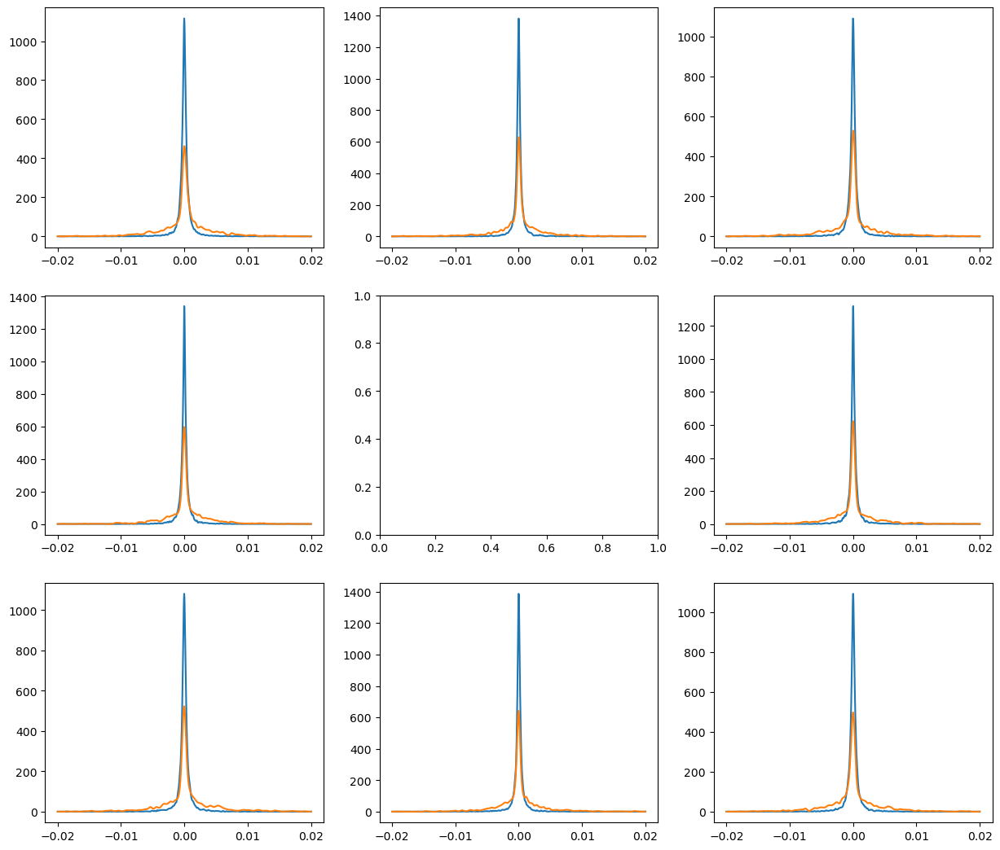

In [532]:
X = np.linspace(-.02, .02, 1000)

fig, axes = plt.subplots(3, 3, figsize = (15, 13))

for i in range(3):
    for j in range(3):
        if (i,j) != (1,1):
            axes[i,j].plot(X, density(X, vels_notgla[3*i+j], sigma_scale=.05))
            axes[i,j].plot(X, density(X, vels_gla[3*i+j], sigma_scale=.05))

In [533]:
X = np.linspace(-.01, .01, 1000)
vels_hist = [density(X, vels_g, sigma_scale=.05)-density(X, vels_ng, sigma_scale=.05)
            for vels_g, vels_ng in zip (vels_gla, vels_notgla)]

C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: divide by zero encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)
C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: invalid value encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)


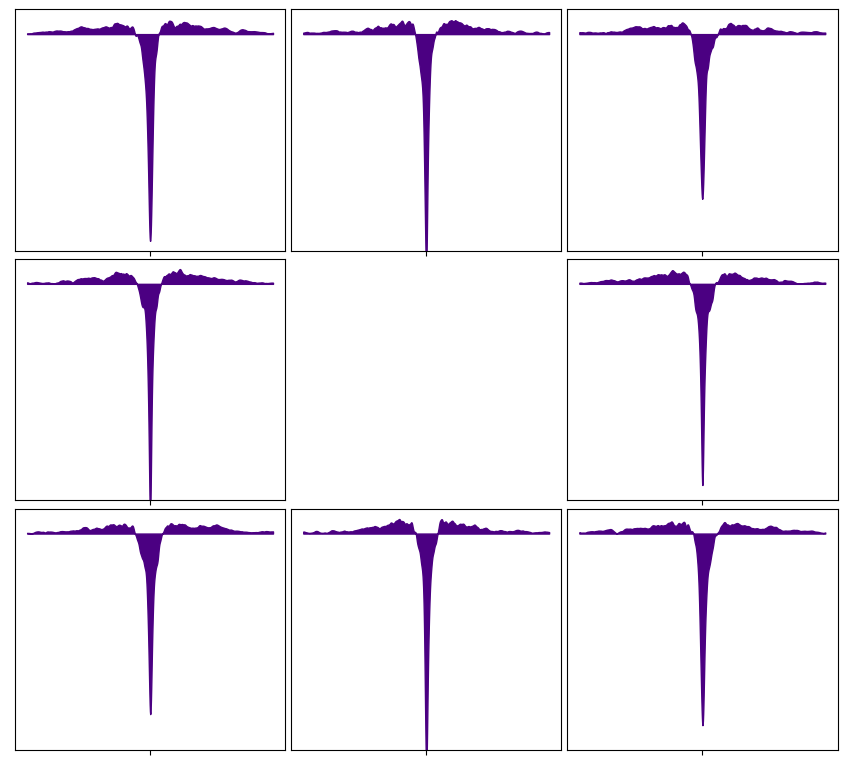

In [534]:
fig, axes = plt.subplots(3, 3, figsize = (9, 8))

plt.tight_layout(h_pad=-1.5, w_pad=-3)

for i in range(3):
    for j, ax in enumerate(axes[i]):
        if [i,j] is not [1,1]:
            ax.fill_between(X, vels_hist[3*i+j], color="indigo")
            ax.set_xticks([0])
            ax.set_xticklabels([""])
            ax.set_yticks([])
            ax.set_ylim((-700,80))
axes[1, 1].axis("off")
plt.show()

In [535]:
relvels_gla = [density(X, vels_g, sigma_scale=.05) for vels_g in vels_gla]
relvels_notgla = [density(X, vels_ng, sigma_scale=.05) for vels_ng in vels_notgla]

avr_gla = np.mean(relvels_gla[:4]+relvels_gla[5:], axis=0)
avr_notgla = np.mean(relvels_notgla[:4]+relvels_notgla[5:], axis=0)

relvels_gla = np.array(relvels_gla) - avr_gla
relvels_notgla = np.array(relvels_notgla) - avr_notgla

relvels_rel = relvels_gla - relvels_notgla

C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: divide by zero encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)
C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: invalid value encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)


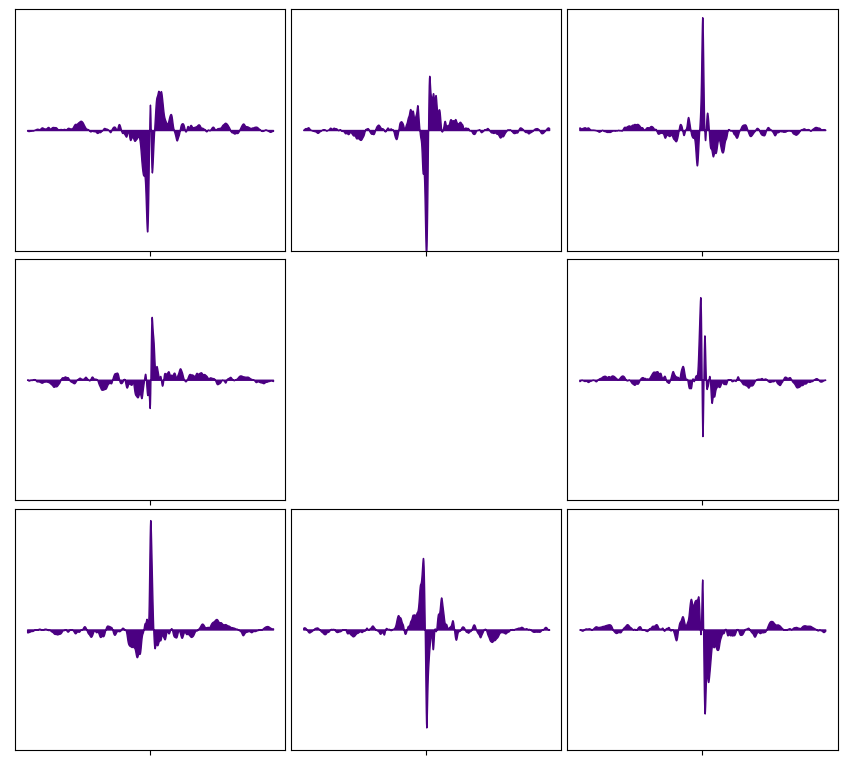

In [536]:
fig, axes = plt.subplots(3, 3, figsize = (9, 8))
plt.tight_layout(h_pad=-1.5, w_pad=-3)

for i in range(3):
    for j, ax in enumerate(axes[i]):
        if [i,j] is not [1,1]:
            ax.fill_between(X, relvels_rel[3*i+j], color="indigo")
            ax.set_xticks([0])
            ax.set_xticklabels([""])
            ax.set_yticks([])
            ax.set_ylim((-120,120))
axes[1, 1].axis("off")
plt.show()

In [30]:
def avg_pool(matrix):
    boolean = type(matrix[0,0]) == np.bool_
    mat = matrix*1
    for _ in range(2):
        mat = np.mean(mat[:, :2* (mat.shape[1]//2)].reshape(mat.shape[0], mat.shape[1]//2, 2) , axis=2).T
    if boolean:
        mat = mat>0.5
    return mat

c3_l2 = avg_pool(c3)
c3_l3 = avg_pool(c3_l2)
engla_l2 = avg_pool(en_glaciares)
engla_l3 = avg_pool(engla_l2)

vels_notgla = convolution_hist(c3_l2, consider = np.logical_not(engla_l2))
vels_gla    = convolution_hist(c3_l2, consider = engla_l2)

In [539]:
X = np.linspace(-.01, .01, 1000)
vels_hist = [density(X, vels_g, sigma_scale=.05)-density(X, vels_ng, sigma_scale=.05)
            for vels_g, vels_ng in zip (vels_gla, vels_notgla)]

C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: divide by zero encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)
C:\Users\Diego\AppData\Local\Temp\ipykernel_3244\2424067158.py:4: RuntimeWarning: invalid value encountered in true_divide
  return np.mean(np.exp(-(X - data.reshape(-1, 1))**2 /(2*sigma**2))/(sigma*np.sqrt(2*np.pi)), axis=0)


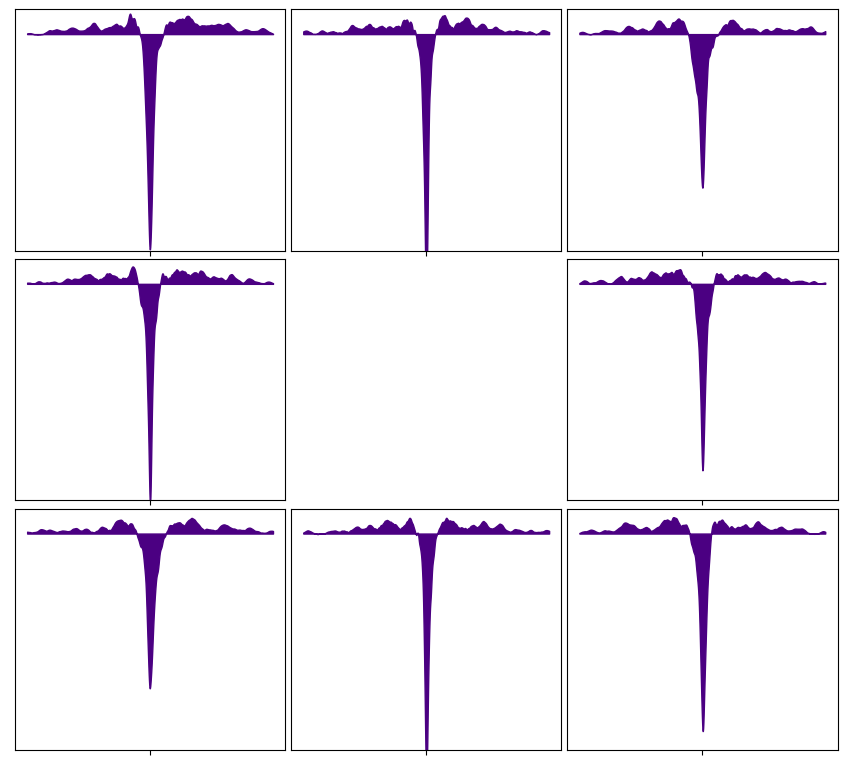

In [540]:
fig, axes = plt.subplots(3, 3, figsize = (9, 8))

plt.tight_layout(h_pad=-1.5, w_pad=-3)

for i in range(3):
    for j, ax in enumerate(axes[i]):
        if [i,j] is not [1,1]:
            ax.fill_between(X, vels_hist[3*i+j], color="indigo")
            ax.set_xticks([0])
            ax.set_xticklabels([""])
            ax.set_yticks([])
            ax.set_ylim((-700,80))
axes[1, 1].axis("off")
plt.show()

In [554]:
def circular_hist(hists, size=24, rang=.01, sigma_scale=.1):
    msize = 2*size +1
    matrix = np.zeros((msize, msize))
    weights = np.zeros((msize, msize))
    coord = np.tile([np.arange(msize)-size], msize).reshape((msize, msize))
    coord = np.array((coord, coord.T)).T
    norm = np.linalg.norm(coord, axis=2)

    for i in range(-1, 2):
        for j in range(-1,2):
            if not (i, j) == (0, 0):
                my_vec = np.array([size*i, size*j])/np.sqrt(i**2+j**2)

                weight = np.abs(np.sum(coord*my_vec, axis=2)/(np.where(norm==0, 1, norm)*np.linalg.norm(my_vec)))
                #weight = np.abs(1-weight/np.pi)
                weight[size, size]=1
                X = np.flip(rang * np.sum(coord*my_vec, axis=2)/(np.linalg.norm(my_vec)**2))

                dens = density(X.flatten(), hists[3*i+j+4], sigma_scale=sigma_scale).reshape(matrix.shape)

                matrix+= dens * weight
                weights+= weight
    return matrix/weights


In [555]:
circular_gla = circular_hist(vels_gla, rang=.015, sigma_scale=.15)

In [556]:
circular_notgla = circular_hist(vels_notgla, rang=.015, sigma_scale=.15)

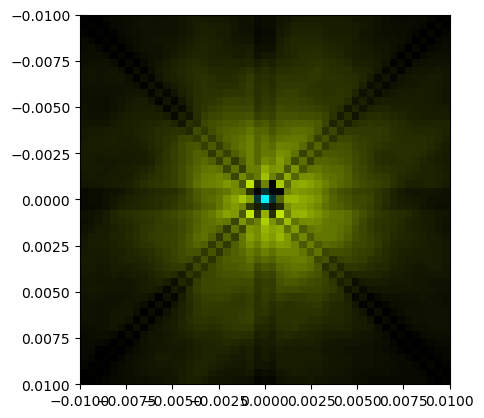

In [557]:
circular_rel = circular_gla-circular_notgla
circular_rel = np.where(circular_rel>0, circular_rel/np.max(circular_rel), -circular_rel/np.min(circular_rel))
plt.imshow(circular_rel, cmap=fluor, extent=[-.01, .01, .01, -.01])

In [558]:
X = np.linspace(-.01, .01, 1000)

mean_vels_gla = np.mean([density(X, vels_g, sigma_scale=.05) for i, vels_g in enumerate(vels_gla) if i!=4], axis=0)

mean_vels_notgla = np.mean([density(X, vels_ng, sigma_scale=.05) for i, vels_ng in enumerate(vels_notgla) if i!=4], axis=0)

(-650.0, 150.0)

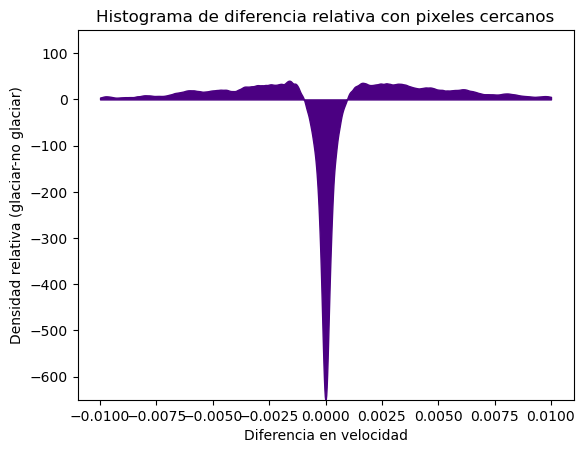

In [559]:
plt.fill_between(X, mean_vels_gla-mean_vels_notgla, color = "indigo")
plt.title("Histograma de diferencia relativa con pixeles cercanos")
plt.xlabel("Diferencia en velocidad")
plt.ylabel("Densidad relativa (glaciar-no glaciar)")
plt.ylim([-650, 150])

(-650.0, 150.0)

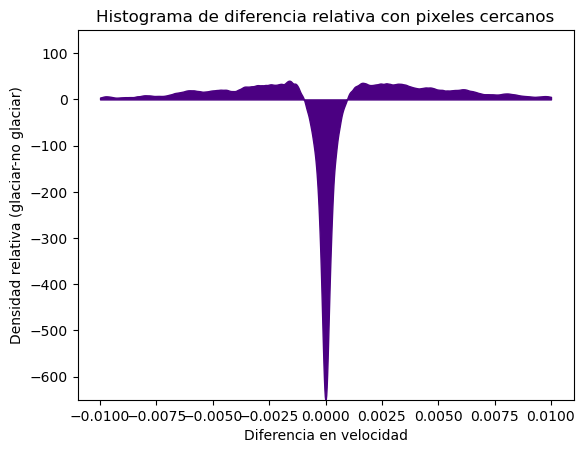

In [560]:
plt.fill_between(X, mean_vels_gla-mean_vels_notgla, color = "indigo")
plt.title("Histograma de diferencia relativa con pixeles cercanos")
plt.xlabel("Diferencia en velocidad")
plt.ylabel("Densidad relativa (glaciar-no glaciar)")
plt.ylim([-650, 150])

Text(0, 0.5, 'Densidad relativa (glaciar-no glaciar)')

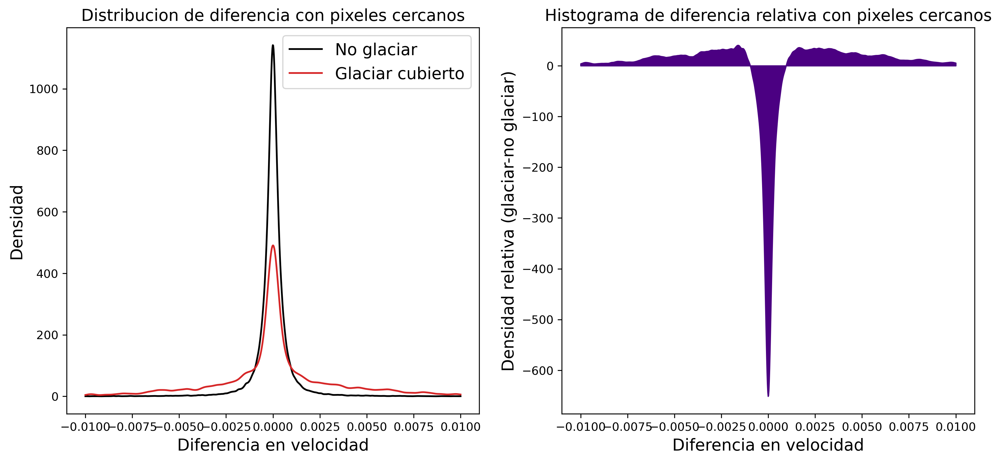

In [561]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
ax1, ax2 = axes
ax1.plot(X, mean_vels_notgla, color="black", label="No glaciar")
ax1.plot(X, mean_vels_gla, color="tab:red", label="Glaciar cubierto")
ax1.set_title("Distribucion de diferencia con pixeles cercanos", size=14)
ax1.set_xlabel("Diferencia en velocidad", size=14)
ax1.set_ylabel("Densidad", size=14)
ax1.legend(prop={"size":14})

ax2.fill_between(X, mean_vels_gla-mean_vels_notgla, color="indigo")
ax2.set_title("Histograma de diferencia relativa con pixeles cercanos", size=14)
ax2.set_xlabel("Diferencia en velocidad", size=14)
ax2.set_ylabel("Densidad relativa (glaciar-no glaciar)", size=14)

### Logistic Regression

In [563]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
import copy


class conv_logreg():
    def __init__(self, ks=1, nlayers=3, itself=True, dif=True, cov=False):
        self.itself = itself
        self.dif =dif
        self.cov = cov
        self.nlayers = nlayers
        self.ks = ks if type(ks) in (tuple, list, np.ndarray) else [ks]
        self.k = self.ks[(len(self.ks) - self.nlayers) % len(self.ks)]
        self.next_layer = None
    def get_features(self, matrix):
        ks = self.k
        pixels = []
        matrix = np.vstack((np.tile(matrix[0], ks).reshape((ks, -1)), matrix, np.tile(matrix[-1], ks).reshape((ks, -1))))
        matrix = np.hstack((np.tile(matrix[:,0], ks).reshape((-1, ks)), matrix, np.tile(matrix[:,-1], ks).reshape((-1, ks))))
        I, J = matrix.shape
        
        if self.itself:
            pixels.append(matrix[ks:-ks, ks:-ks].flatten())
        for i in range(-ks, ks+1):
            for j in range(-ks, ks+1):
                if self.dif and (i, j) != (0, 0):
                    pixels.append((matrix[ks:-ks, ks:-ks] - matrix[ks+i:I-ks+i, ks+j:J-ks+j]).flatten())
                if self.cov:
                    pixels.append((matrix[ks:-ks, ks:-ks] * matrix[ks+i:I-ks+i, ks+j:J-ks+j]).flatten())
        return np.array(pixels).T
    
    def fit(self, matrix, target, verbose=True):
        self.target = target.flatten()
        self.pixels = self.get_features(matrix)

        self.scaler = StandardScaler().fit(self.pixels)
        self.pixels = self.scaler.transform(self.pixels)

        self.model = LogisticRegression(max_iter = 500, class_weight="balanced")
        self.model.fit(self.pixels, self.target*1)
        
        self.probas = self.model.predict_proba(self.pixels)[:, 1]
        self.probas_mat = self.probas.reshape(matrix.shape)
        
        self.target_mat = self.target.reshape(matrix.shape)

        if verbose:
            self.report()
        
        if self.nlayers > 1:
            self.next_layer = conv_logreg(self.ks, self.nlayers - 1, self.itself, self.dif, self.cov)
            self.next_layer.fit(*self.max_pool())

    def max_pool(self, probas=None, target=None):
        prb, tar = (self.probas_mat if probas is None else probas), (self.target_mat*1 if target is None else target)
        for _ in range(2):
            prb = np.max( prb[:, :2* (prb.shape[1]//2)].reshape(prb.shape[0], prb.shape[1]//2, 2) , axis=2).T
            tar = np.mean(tar[:, :2* (tar.shape[1]//2)].reshape(tar.shape[0], tar.shape[1]//2, 2) , axis=2).T
        
        return prb, (tar>=.5)
        
    def predict(self, matrix, weight=3):
        pixels = self.get_features(matrix)
        pixels = self.scaler.transform(pixels)
        
        probas = self.model.predict_proba(pixels)[:, 1]
        probas_mat = probas.reshape(matrix.shape)
        
        if self.nlayers == 1:
            return probas_mat
        else:
            next_probas = self.next_layer.predict(self.max_pool(probas_mat)[0], weight=weight)
            next_probas = np.repeat(np.tile(next_probas, 2), 2).reshape(2 * np.array(next_probas.shape))
            next_probas = np.vstack((next_probas, next_probas[-1])) if next_probas.shape[0] < matrix.shape[0] else next_probas
            next_probas = np.hstack((next_probas, next_probas[:,-1:])) if next_probas.shape[1] < matrix.shape[1] else next_probas
            return (probas_mat * next_probas**weight) ** (1.0/(weight+1))
        
    def project(self):
        self.pix_t = self.pixels[self.target]
        self.pix_f = self.pixels[np.logical_not(self.target)]
        
        self.pix_t = self.scaler.transform(self.pix_t)
        self.pix_f = self.scaler.transform(self.pix_f)

        self.pca = PCA(n_components=1).fit(self.pixels)
        self.pixels_pc = pca.transform(self.pixels)

        self.pix_t_pc = np.column_stack((np.sum(self.pix_t * self.model.coef_, axis=1) + self.model.intercept_, 
                                         self.pca.transform(self.pix_t)))
        self.pix_f_pc = np.column_stack((np.sum(self.pix_f * self.model.coef_, axis=1) + self.model.intercept_,
                                         self.pca.transform(self.pix_f)))
        
    
    def report(self):
        print("Remaining layers:", self.nlayers-1)
        prds = self.probas>.5
        print("Accuracy:", np.sum(prds == self.target)/len(prds))
        print("True positives:", np.sum(prds[self.target == 1])/np.sum(self.target))
        print("False positives:", np.sum(prds[self.target == 0])/np.sum(1-self.target))


In [565]:
model_1 = conv_logreg(5, 4, itself=False)

model_1.fit(c3, en_glaciares)

Remaining layers: 3
Accuracy: 0.832171006856939
True positives: 0.4817668207498716
False positives: 0.167347396895136
Remaining layers: 2
Accuracy: 0.809254269267488
True positives: 0.6789168278529981
False positives: 0.19055512340004244
Remaining layers: 1
Accuracy: 0.842164816637813
True positives: 0.8857142857142857
False positives: 0.15790428051724334
Remaining layers: 0
Accuracy: 0.9704260651629073
True positives: 1.0
False positives: 0.02962929145361578


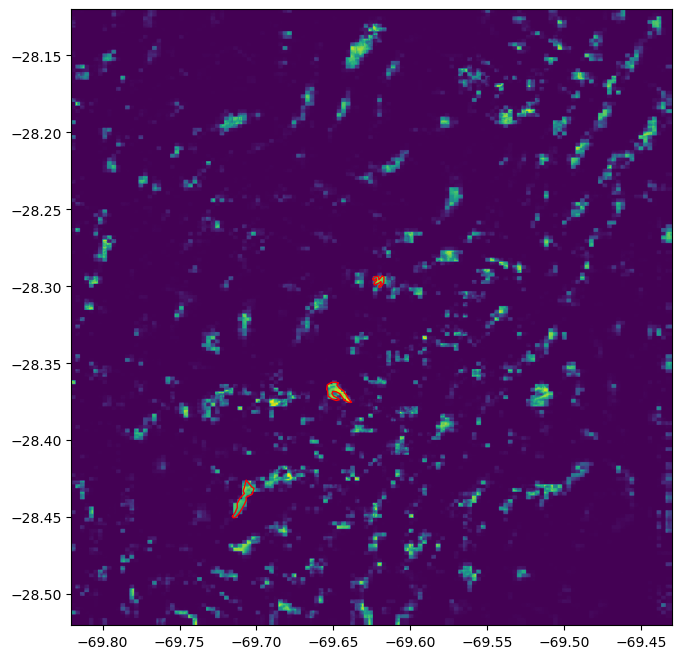

In [568]:
predicted = model_1.predict(c3, weight=3)
mapper3.draw(predicted, linecol="red", linewidth=1, glaciares = [glaciar_1, glaciar_2, glaciar_3])

# Modo 4 coordenadas

In [34]:
extentp = [
[-28.135040692,-69.814854926],
[-28.136758905,-69.439313578],
[-28.516116227,-69.817766437],
[-28.517861891,-69.440883415]
]
extentp = np.array(extentp)

In [43]:
extent_tif_1 = pd.read_csv("https://github.com/alcazar90/rock-glacier-detection/raw/main/data/extents/extent_tif_1.tsv",
                          header = None).to_numpy()

In [46]:
extentp == extent_tif_1

array([[ True,  True],
       [ True,  True],
       [ True,  True],
       [ True,  True]])

(-7.0, 7.0)

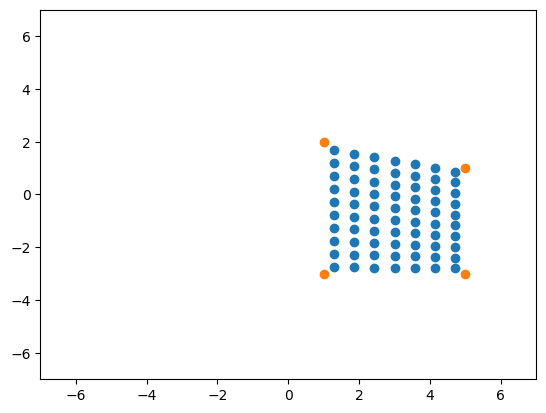

In [56]:
import numpy as np
import matplotlib.pyplot as plt

def project_trapezoid(corners, shape):
    def midspace(c1, c2, size):
        lins = np.linspace(c1, c2, size+1)
        return np.mean((lins[1:], lins[:-1]), axis=0)
    side1 = midspace(corners[0], corners[1], shape[1])
    side2 = midspace(corners[2], corners[3], shape[1])
    return np.concatenate([midspace(s1, s2, shape[0]) for s1, s2 in zip(side1, side2)])
    
corners = np.array([[1,2], [5,1], [1,-3], [5,-3]])
points = project_trapezoid(corners, (10, 7))

plt.scatter(points[:,0], points[:,1])
plt.scatter(corners[:,0], corners[:,1])
plt.xlim(-7,7)
plt.ylim(-7,7)

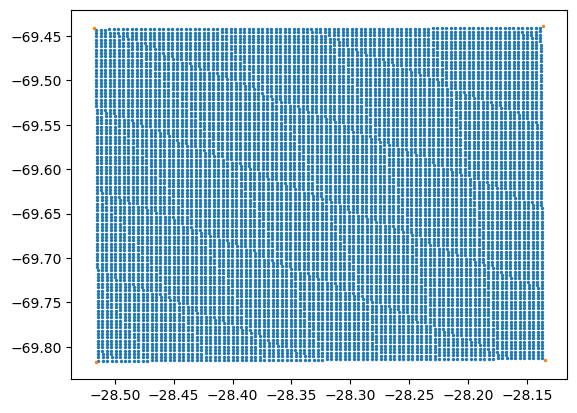

In [43]:
points = project_trapezoid(extent2, (100,100))

plt.scatter(points[:,0], points[:,1], s=2)
plt.scatter(extent2[:,0], extent2[:,1], s=2)

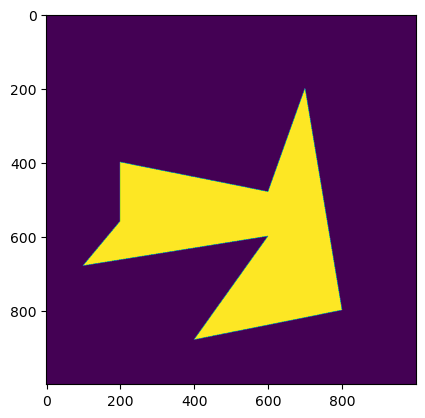

In [118]:
def matrix_polygon_2(shape, extent, polygon, verbose=False, lower_up=False):
    #Normalizo minmax para evitar en lo posible errores numéricos cuando los triángulos tienen formas muy bizarras
    mean, var = np.mean(extent, axis=0), 100/(np.max(extent, axis=0)- np.min(extent, axis=0))
    extent, polygon = (var*(np.array(extent)-mean)), var*(np.array(polygon)-mean)
    
    def midspace(c1, c2, size):
        lins = np.linspace(c1, c2, size+1)
        return np.mean((lins[1:], lins[:-1]), axis=0)
    side1 = midspace(extent[0], extent[2], shape[0])
    side2 = midspace(extent[1], extent[3], shape[0])
    points = np.concatenate([midspace(s1, s2, shape[1]) for s1, s2 in zip(side1, side2)])
    matrix = in_polygon(points, polygon, verbose=verbose)
    return matrix.reshape(shape)

sq = np.array([
    [ 50,-20],
    [ 50,-15],
    [ 75,-20],
    [ 75,-15]
])

matrix = matrix_polygon_2(shape = (1000, 1000), extent =sq, polygon = np.array([[60,-19], 
                                [62,-17], [55, -16.5], [70,-16], [72, -18], [65,-17], [67, -19.5], [64, -19]]))

plt.imshow(matrix)

In [144]:
en_glaciar_tif_1 = matrix_polygon_2((4222, 3688), extent2, glaciar_1, verbose=True)

Computando triángulo 1 de 17
Computando triángulo 2 de 17
Computando triángulo 3 de 17
Computando triángulo 4 de 17
Computando triángulo 5 de 17
Computando triángulo 6 de 17
Computando triángulo 7 de 17
Computando triángulo 8 de 17
Computando triángulo 9 de 17
Computando triángulo 10 de 17
Computando triángulo 11 de 17
Computando triángulo 12 de 17
Computando triángulo 13 de 17
Computando triángulo 14 de 17
Computando triángulo 15 de 17
Computando triángulo 16 de 17
Computando triángulo 17 de 17


In [145]:
en_glaciar_tif_2 = matrix_polygon_2((4222, 3688), extent2, glaciar_2, verbose=True)

Computando triángulo 1 de 26
Computando triángulo 2 de 26
Computando triángulo 3 de 26
Computando triángulo 4 de 26
Computando triángulo 5 de 26
Computando triángulo 6 de 26
Computando triángulo 7 de 26
Computando triángulo 8 de 26
Computando triángulo 9 de 26
Computando triángulo 10 de 26
Computando triángulo 11 de 26
Computando triángulo 12 de 26
Computando triángulo 13 de 26
Computando triángulo 14 de 26
Computando triángulo 15 de 26
Computando triángulo 16 de 26
Computando triángulo 17 de 26
Computando triángulo 18 de 26
Computando triángulo 19 de 26
Computando triángulo 20 de 26
Computando triángulo 21 de 26
Computando triángulo 22 de 26
Computando triángulo 23 de 26
Computando triángulo 24 de 26
Computando triángulo 25 de 26
Computando triángulo 26 de 26


In [146]:
en_glaciar_tif_3 = matrix_polygon_2((4222, 3688), extent2, glaciar_3, verbose=True)

Computando triángulo 1 de 25
Computando triángulo 2 de 25
Computando triángulo 3 de 25
Computando triángulo 4 de 25
Computando triángulo 5 de 25
Computando triángulo 6 de 25
Computando triángulo 7 de 25
Computando triángulo 8 de 25
Computando triángulo 9 de 25
Computando triángulo 10 de 25
Computando triángulo 11 de 25
Computando triángulo 12 de 25
Computando triángulo 13 de 25
Computando triángulo 14 de 25
Computando triángulo 15 de 25
Computando triángulo 16 de 25
Computando triángulo 17 de 25
Computando triángulo 18 de 25
Computando triángulo 19 de 25
Computando triángulo 20 de 25
Computando triángulo 21 de 25
Computando triángulo 22 de 25
Computando triángulo 23 de 25
Computando triángulo 24 de 25
Computando triángulo 25 de 25


In [149]:
en_glaciar_tif = np.any((en_glaciar_tif_1, en_glaciar_tif_2, en_glaciar_tif_3), axis=0)

In [340]:
extentb = np.array([
    [-28.11996841, -69.82037354], 
    [-28.11996841, -69.42983246], 
    [-28.52018356, -69.82037354], 
    [-28.52018356, -69.42983246]
])

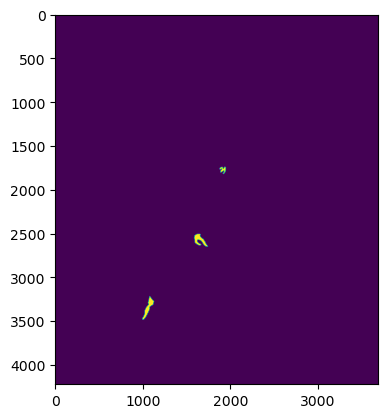

In [150]:
plt.imshow(en_glaciar_tif)

In [129]:
df_en_glaciar = pd.DataFrame(en_glaciar*1)


In [135]:
df_en_glaciar.to_csv("en_glaciar_tif.csv", header=False, index=False)

In [2]:
extent1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_1/extent.tsv", sep="\t", header=None).to_numpy()
extent2 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_2/extent.tsv", sep="\t", header=None).to_numpy()
extent3 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/c_3/extent.tsv", sep="\t", header=None).to_numpy()

# GeoTiff

In [20]:
from geotiff import GeoTiff

In [21]:
import os
os.listdir("../data/dataset/polygon_images/")

['RT_L1C_T19JDJ_A035557_20220413T144923.tif',
 'RT_T19JDJ_A035986_20220513T144515.tif',
 'RT_T19JDJ_A036129_20220523T144523.tif',
 'RT_T19JDJ_A036415_20220612T144942.tif',
 'RT_T19JDJ_A036844_20220712T144937.tif',
 'RT_T19JDJ_A036987_20220722T144921.tif',
 'RT_T19JDJ_A037559_20220831T144448.tif',
 'RT_T19JDJ_A037702_20220910T144450.tif',
 'RT_T19JDJ_A037845_20220920T144943.tif',
 'RT_T19JDJ_A037988_20220930T145022.tif']

In [23]:
ds1 = GeoTiff("../data/dataset/polygon_images/RT_L1C_T19JDJ_A035557_20220413T144923.tif")
ds2 = GeoTiff("../data/dataset/polygon_images_n/L1C_T19JEL_A035843_20220503T144535.tif")

In [36]:
ds2 = np.array(ds2.read())

In [22]:
datasets_folder = "../data/dataset/polygon_images/"
dataset_files = os.listdir(datasets_folder)
datasets = [np.array(GeoTiff(datasets_folder + file).read()) for file in dataset_files]

In [25]:
datasets = [dataset[:, :, :3] for dataset in datasets]

In [26]:
datasets[0].shape

(4222, 3688, 3)

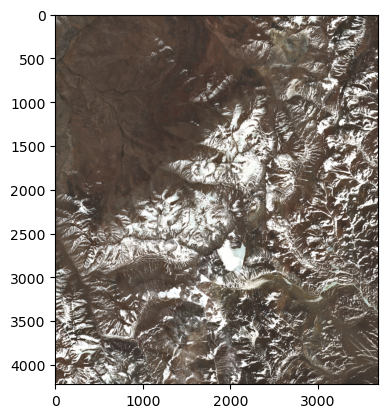

In [54]:
import matplotlib.pyplot as plt
plt.imshow(datasets[9][:,:,:3])

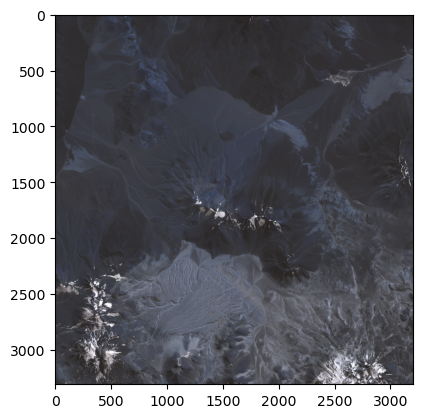

In [37]:
plt.imshow(ds2)

In [24]:
import pandas as pd
glaciar_1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_1_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_2 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_2_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_3 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_3_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_4 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_4_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_5 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_5_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_6 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_6_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_n_1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_n_1_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_s_1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_s_1_strict.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_area_1 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_area_1.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_area_2 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_area_2.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_area_3 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_area_3.tsv", sep="\t", header=None).to_numpy()[:-1]
glaciar_area_4 = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/glaciar_area_4.tsv", sep="\t", header=None).to_numpy()[:-1]
argentina = pd.read_csv("https://raw.githubusercontent.com/alcazar90/rock-glacier-detection/main/data/glaciares/argentina.tsv", sep="\t", header=None).to_numpy()[:-1]


glaciar_1 = glaciar_1[:,[1,0]]
glaciar_2 = glaciar_2[:,[1,0]]
glaciar_3 = glaciar_3[:,[1,0]]
glaciar_4 = glaciar_4[:,[1,0]]
glaciar_5 = glaciar_5[:,[1,0]]
glaciar_6 = glaciar_6[:,[1,0]]
glaciar_n_1 = glaciar_n_1[:,[1,0]]
glaciar_s_1 = glaciar_s_1[:,[1,0]]
glaciar_area_1 = glaciar_area_1[:,[1,0]]
glaciar_area_2 = glaciar_area_2[:,[1,0]]
glaciar_area_3 = glaciar_area_3[:,[1,0]]
glaciar_area_4 = glaciar_area_4[:,[1,0]]
argentina = argentina[:,[1,0]]

In [43]:
en_glaciar_tif_1 = matrix_polygon((4222, 3688), extentp, glaciar_1)

Computando triángulo 1 de 17
Computando triángulo 2 de 17
Computando triángulo 3 de 17
Computando triángulo 4 de 17
Computando triángulo 5 de 17
Computando triángulo 6 de 17
Computando triángulo 7 de 17
Computando triángulo 8 de 17
Computando triángulo 9 de 17
Computando triángulo 10 de 17
Computando triángulo 11 de 17
Computando triángulo 12 de 17
Computando triángulo 13 de 17
Computando triángulo 14 de 17
Computando triángulo 15 de 17
Computando triángulo 16 de 17
Computando triángulo 17 de 17


In [55]:
mapper_tif = mapper(extentp, datasets[0][:, :, 0].shape)

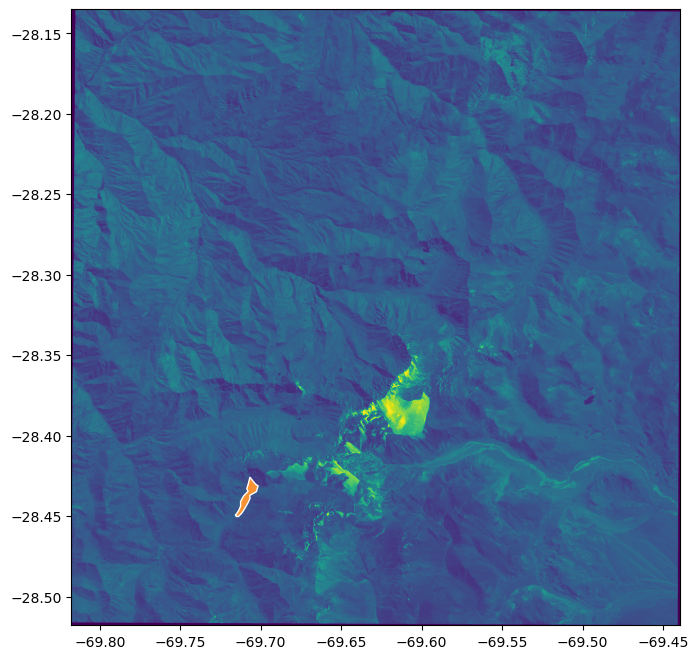

In [65]:
mapper_tif.draw([datasets[0][:, :, 0], en_glaciar_tif_1], glaciares = [glaciar_1], linewidth=1, cmaps=["viridis", glow])

In [57]:
datasets[0][:, :, 0].shape

(4222, 3688)

In [67]:
print("Glaciar 2")
en_glaciar_tif_2 = matrix_polygon((4222, 3688), extentp, glaciar_2)
print("Glaciar 3")
en_glaciar_tif_3 = matrix_polygon((4222, 3688), extentp, glaciar_3)
print("Glaciar 4")
en_glaciar_tif_4 = matrix_polygon((4222, 3688), extentp, glaciar_4)
print("Glaciar 5")
en_glaciar_tif_5 = matrix_polygon((4222, 3688), extentp, glaciar_5)
print("Glaciar 6")
en_glaciar_tif_6 = matrix_polygon((4222, 3688), extentp, glaciar_6)
print("Area 1")
en_glaciar_tif_area_1 = matrix_polygon((4222, 3688), extentp, glaciar_area_1)
print("Area 2")
en_glaciar_tif_area_2 = matrix_polygon((4222, 3688), extentp, glaciar_area_2)
print("Area 3")
en_glaciar_tif_area_3 = matrix_polygon((4222, 3688), extentp, glaciar_area_3)
print("Area 4")
en_glaciar_tif_area_4 = matrix_polygon((4222, 3688), extentp, glaciar_area_4)
print("Argentina")
en_argentina_tif = matrix_polygon((4222, 3688), extentp, argentina)

Glaciar 2
Glaciar 3
Glaciar 4
Glaciar 5
Glaciar 6
Area 1
Area 2
Area 3
Area 4
Argentina


In [68]:
en_glaciar_tif = np.any((en_glaciar_tif_1, en_glaciar_tif_2, en_glaciar_tif_3, 
                         en_glaciar_tif_4, en_glaciar_tif_5, en_glaciar_tif_6), axis=0)

In [69]:
sin_glaciar_tif = np.logical_not(np.any((en_glaciar_tif_area_1, en_glaciar_tif_area_2, 
                         en_glaciar_tif_area_3, en_glaciar_tif_area_4, en_argentina_tif), axis=0))

In [48]:
en_glaciar_tif  = np.load("en_glaciar_tif_z1.npy")
sin_glaciar_tif = np.load("sin_glaciar_tif_z1.npy")

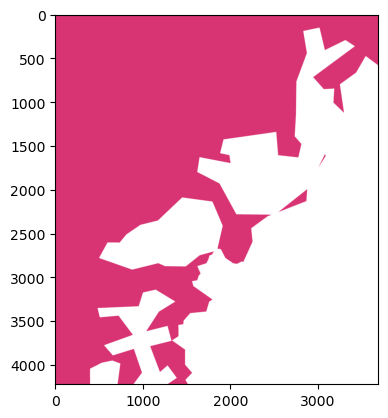

In [52]:
plt.imshow(sin_glaciar_tif, cmap = danger)

In [74]:
np.save("en_glaciar_tif_z1", en_glaciar_tif)
np.save("sin_glaciar_tif_z1", sin_glaciar_tif)

In [35]:
def broaden_mask(mask, thick):
    new_mask = mask.copy()
    I, J = mask.shape
    T = thick
    new_mask[:T] = np.full_like(mask[:T], False)
    new_mask[-T:] = np.full_like(mask[-T:], False)
    new_mask[:,:T] = np.full_like(mask[:,:T], False)
    new_mask[:,-T:] = np.full_like(mask[:,-T:], False)
    
    def minibroaden(shape):
        i, j = shape
        new_mask[T:-T, T:-T] = np.all((new_mask[T:-T, T:-T], mask[T+i:I-T+i, T+j:J-T+j]), axis=0)
    
    for i in (-T, T):
        for j in range(-T, T):
            minibroaden((i, j))
    for j in (-T, T):
        for i in range(-T+1, T-1):
            minibroaden((i, j))
            
    return new_mask


In [36]:
    
broad_sin_glaciar_tif = broaden_mask(sin_glaciar_tif, 64)

In [58]:
def generate_samples(mask, size, n_samples, weight_decay = 100, power=1, decay =True):
    samples = np.zeros((n_samples, 4))
    mask_weights, S = mask*1.0, size
    decay_matrix = weight_decay**(np.array([[(size - np.abs(j-size))*(size - np.abs(i-size))/size**2 
                                            for j in range(2*size)] for i in range(2*size)])**power)
    for ns in range(n_samples):
        mask_flat = mask_weights.flatten()
        center_flat = np.random.choice(np.arange(len(mask_flat)), p = mask_flat/np.sum(mask_flat))
        C = center_flat // mask.shape[1], center_flat % mask.shape[1]
        samples[ns] = np.array([C[0]-size//2, C[0]+size//2, C[1]-size//2, C[1]+size//2])
        if decay:
            dm = [max(C[0]-S,0) - C[0], min(C[0]+S, mask.shape[0]) - C[0], max(C[1]-S,0) - C[1], min(C[1]+S, mask.shape[1]) - C[1]]
            mask_weights[C[0] +dm[0]: C[0] +dm[1], C[1] +dm[2]: C[1] +dm[3]]= \
            mask_weights[C[0] +dm[0]: C[0] +dm[1], C[1] +dm[2]: C[1] +dm[3]] / decay_matrix[S +dm[0]: S +dm[1], S +dm[2]: S +dm[3]]

        if ns%50 ==0: print(ns)
        
    return mask_weights, samples


In [ ]:
    

samples_sin_bite, samples_sin =generate_samples(broad_sin_glaciar_tif, 128, 1000)

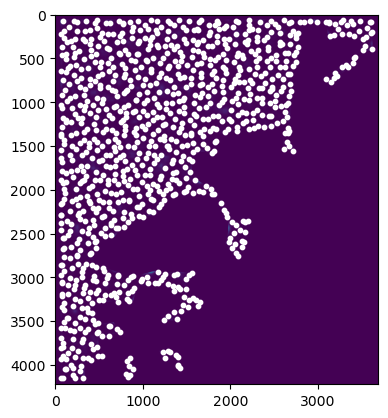

In [265]:
plt.imshow(samples_sin_bite)

a = (samples_sin[:,0]+samples_sin[:,1])/2, (samples_sin[:,2]+samples_sin[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [55]:
broad_en_glaciar_tif = np.logical_not(broaden_mask(np.logical_not(en_glaciar_tif), 24))

In [56]:
broad_glaciar_1 = broad_en_glaciar_tif[1500:1950, 1730:2950]
broad_glaciar_2 = broad_en_glaciar_tif[2370:2970, 650:1900]
broad_glaciar_3 = broad_en_glaciar_tif[3080:3630, 860:1270]

In [59]:
samples_glaciar1_bite, samples_glaciar1 =generate_samples(broad_glaciar_1, 128, 260, weight_decay=1.5)

0
50
100
150
200
250


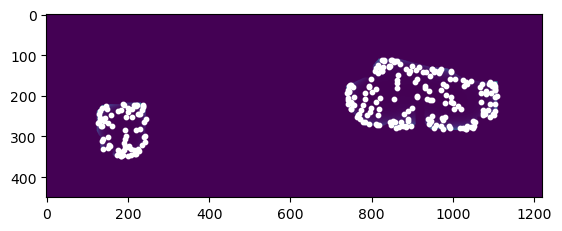

In [60]:
plt.imshow(samples_glaciar1_bite)

a = (samples_glaciar1[:,0]+samples_glaciar1[:,1])/2, (samples_glaciar1[:,2]+samples_glaciar1[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [61]:
samples_glaciar2_bite, samples_glaciar2 =generate_samples(broad_glaciar_2, 128, 430, weight_decay=1.5)

0
50
100
150
200
250
300
350
400


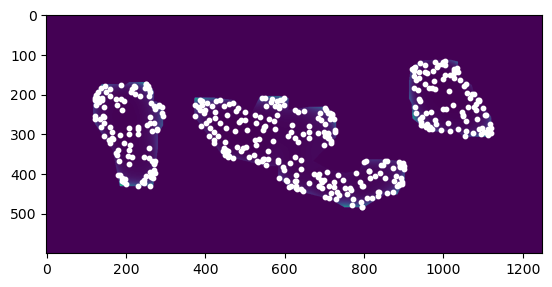

In [62]:
plt.imshow(samples_glaciar2_bite)

a = (samples_glaciar2[:,0]+samples_glaciar2[:,1])/2, (samples_glaciar2[:,2]+samples_glaciar2[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [63]:
samples_glaciar3_bite, samples_glaciar3 =generate_samples(broad_glaciar_3, 128, 130, weight_decay=1.5)

0
50
100


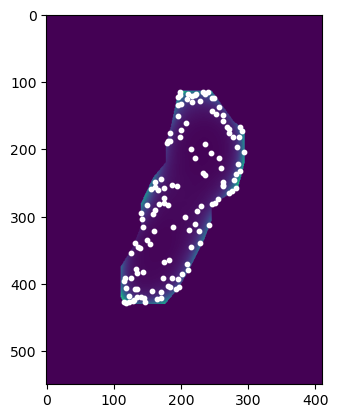

In [64]:
plt.imshow(samples_glaciar3_bite)

a = (samples_glaciar3[:,0]+samples_glaciar3[:,1])/2, (samples_glaciar3[:,2]+samples_glaciar3[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [65]:
samples_glaciar1_fit = samples_glaciar1 + np.array([1500, 1500, 1730, 1730])
samples_glaciar2_fit = samples_glaciar2 + np.array([2370, 2370,  650,  650])
samples_glaciar3_fit = samples_glaciar3 + np.array([3080, 3080,  860,  860])

In [66]:
samples_glaciar = np.concatenate([samples_glaciar1_fit, samples_glaciar2_fit, samples_glaciar3_fit])

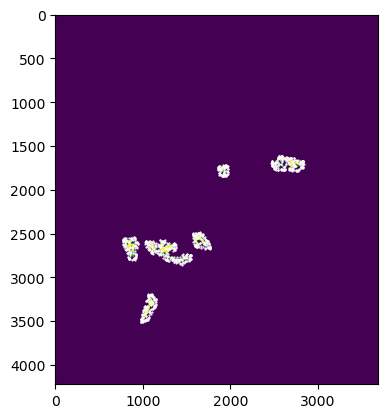

In [67]:
plt.imshow(en_glaciar_tif)

a = (samples_glaciar[:,0]+samples_glaciar[:,1])/2, (samples_glaciar[:,2]+samples_glaciar[:,3])/2
plt.scatter(a[1], a[0], color="white", s=.3)

In [68]:
def sample_images(samples, mask, images, augmentate=True, weights = None):
    samples = samples.astype(int)
    weights = weights if weights is None else np.array(weights)/np.sum(weights)
    imgs = []
    msks = []
    order = np.arange(len(samples))
    np.random.shuffle(order)
    for sam in samples[order]:
        image = images[np.random.choice(np.arange(len(images)), p = weights)]
        img=image[sam[0]:sam[1], sam[2]:sam[3]]
        msk= mask[sam[0]:sam[1], sam[2]:sam[3]]
        if augmentate:
            rotation = np.random.randint(4)
            transpos = (np.random.randint(2) ==0)
            img = np.rot90(img, rotation)
            msk = np.rot90(msk, rotation)
            img = np.transpose(img, axes = (1, 0, 2)) if transpos else img
            msk = msk.T if transpos else msk
        imgs.append(img)
        msks.append(msk)
    return imgs, msks
    


In [95]:
images_glaciar, masks_glaciar = sample_images(samples_glaciar, en_glaciar_tif, datasets)


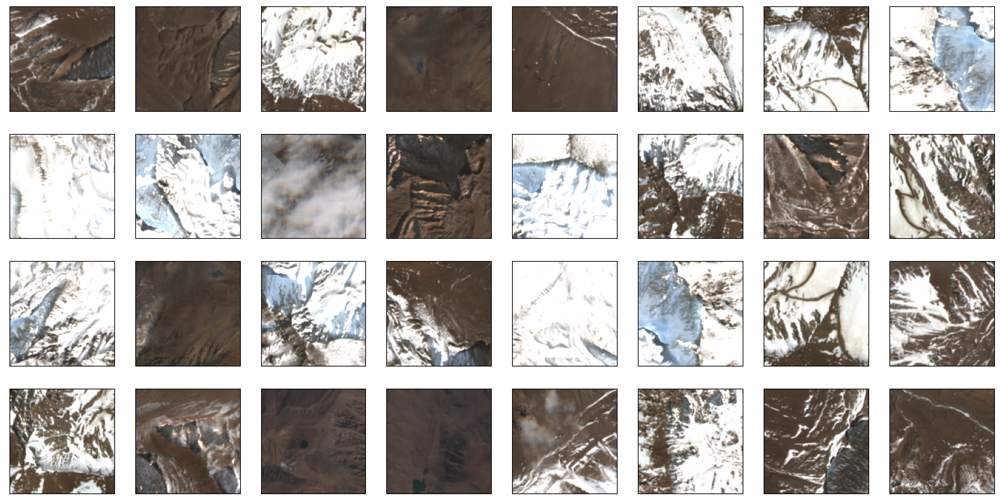

In [102]:
fig, axes = plt.subplots(4, 8, figsize = (20,10))
axes = axes.flatten()
#fig.tight_layout(h_pad=-1, w_pad=-8)
for ax, img in zip(axes, images_glaciar):
    ax.imshow(img[:, :, :3], cmap = sky)
    #ax.imshow(img, cmap = sky)
    ax.set_xticks([])
    ax.set_yticks([])
    

In [559]:
images_sin, masks_sin = sample_images(samples_sin, en_glaciar_tif, datasets)

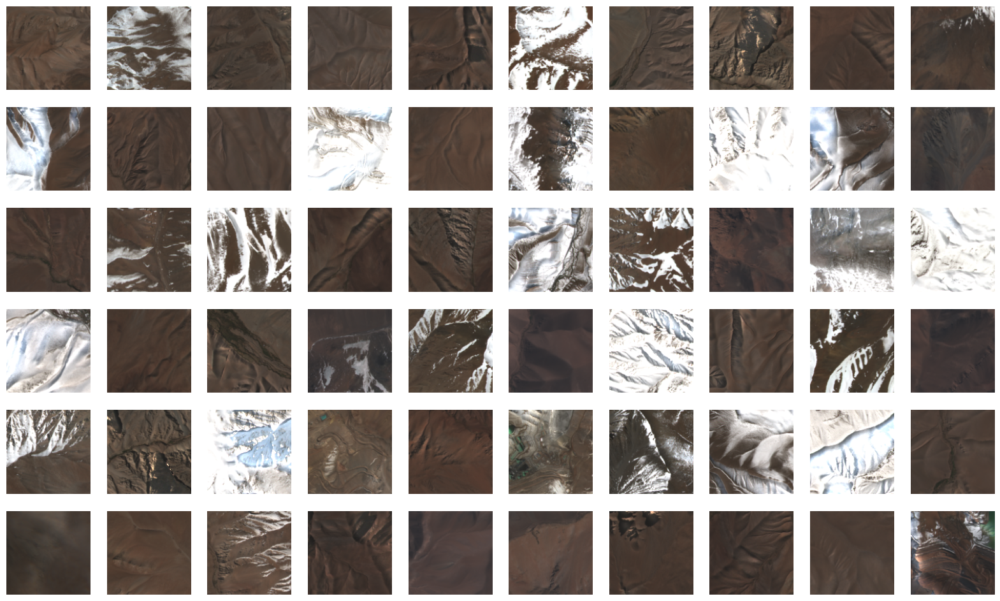

In [563]:
fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
#fig.tight_layout(h_pad=-1, w_pad=-8)
for ax, img in zip(axes, images_sin):
    ax.imshow(img)
    ax.axis("off")

In [578]:
for i, img in enumerate(images_sin):
    img = np.clip(img, 0, 1)
    matplotlib.image.imsave(f'samples/cordillera_{"0"*(3-len(str(i))) + str(i)}.png', img)

In [580]:
for i, img in enumerate(masks_glaciar):
    img = np.clip(img, 0, 1)
    matplotlib.image.imsave(f'samples/mask_{"0"*(3-len(str(i))) + str(i)}.png', -1*img, cmap = "Greys")

### Resampling

In [26]:
en_glaciar_tif  = np.load("en_glaciar_tif_z1.npy")
sin_glaciar_tif = np.load("sin_glaciar_tif_z1.npy")

In [27]:
broad_en_glaciar_tif = np.logical_not(broaden_mask(np.logical_not(en_glaciar_tif), 24))

In [37]:
broad_glaciar_1 = broad_en_glaciar_tif[1500:1950, 1730:2950]
broad_glaciar_2 = broad_en_glaciar_tif[2370:2970, 650:1900]
broad_glaciar_3 = broad_en_glaciar_tif[3080:3630, 860:1270]

0
50
100
150
200
250


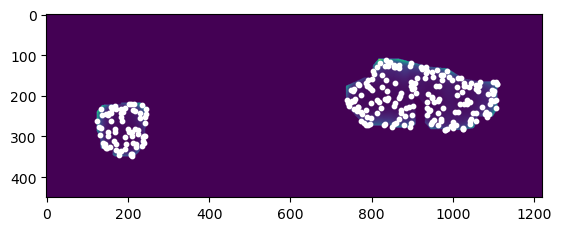

In [48]:
samples_glaciar1_bite, samples_glaciar1 =generate_samples(broad_glaciar_1, 256, 260, weight_decay=1.5, power = 5)

plt.imshow(samples_glaciar1_bite)

a = (samples_glaciar1[:,0]+samples_glaciar1[:,1])/2, (samples_glaciar1[:,2]+samples_glaciar1[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

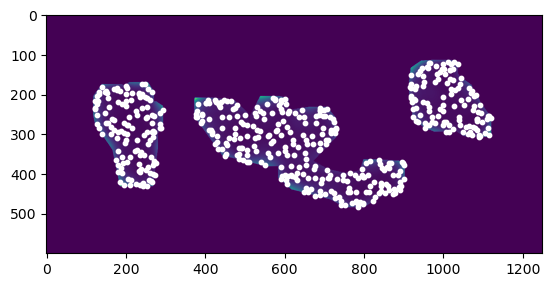

In [45]:
samples_glaciar2_bite, samples_glaciar2 =generate_samples(broad_glaciar_2, 256, 500, weight_decay=1.5, power = 5)

plt.imshow(samples_glaciar2_bite)

a = (samples_glaciar2[:,0]+samples_glaciar2[:,1])/2, (samples_glaciar2[:,2]+samples_glaciar2[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

0
50
100
150


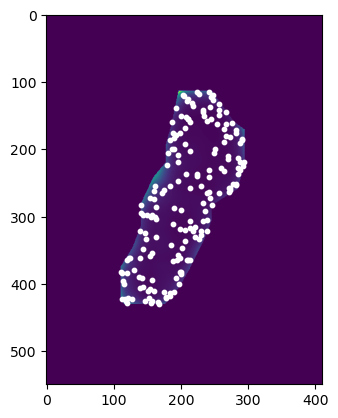

In [47]:
samples_glaciar3_bite, samples_glaciar3 =generate_samples(broad_glaciar_3, 256, 180, weight_decay=1.5, power = 5)

plt.imshow(samples_glaciar3_bite)

a = (samples_glaciar3[:,0]+samples_glaciar3[:,1])/2, (samples_glaciar3[:,2]+samples_glaciar3[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [50]:
samples_glaciar1_fit = samples_glaciar1 + np.array([1500, 1500, 1730, 1730])
samples_glaciar2_fit = samples_glaciar2 + np.array([2370, 2370,  650,  650])
samples_glaciar3_fit = samples_glaciar3 + np.array([3080, 3080,  860,  860])

In [51]:
resamples_glaciar = np.concatenate([samples_glaciar1_fit, samples_glaciar2_fit, samples_glaciar3_fit])

In [155]:
re_images_glaciar, re_masks_glaciar = sample_images(resamples_glaciar, en_glaciar_tif, 
                                                    datasets, weights =[10, 10, 10, 10, 6, 4, 8, 0, 10, 10])

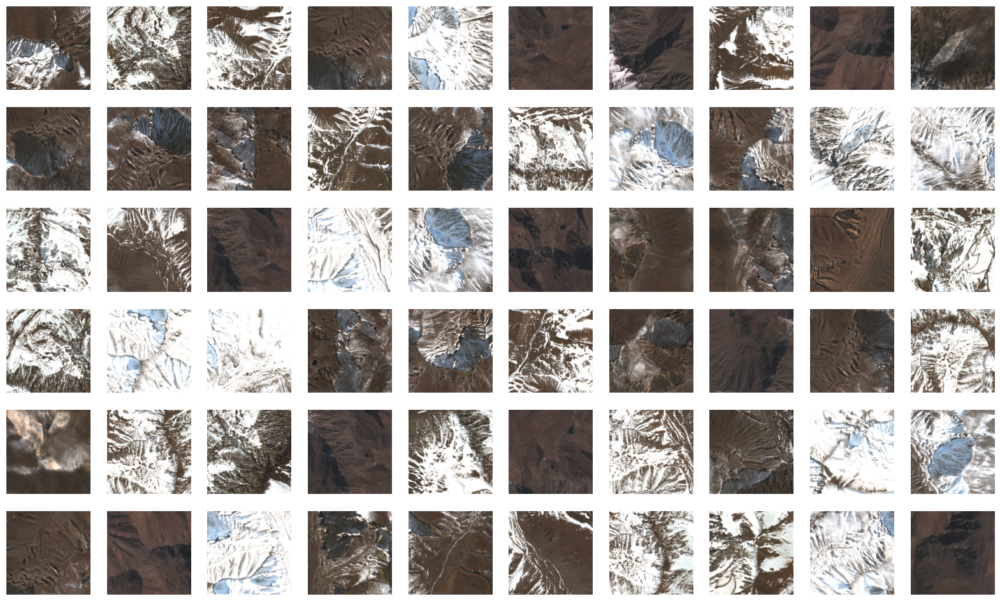

In [157]:
fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
#fig.tight_layout(h_pad=-1, w_pad=-8)
for ax, img in zip(axes, re_images_glaciar):
    ax.imshow(img)
    ax.axis("off")

In [58]:
broad_sin_glaciar_tif = broaden_mask(sin_glaciar_tif, 128)

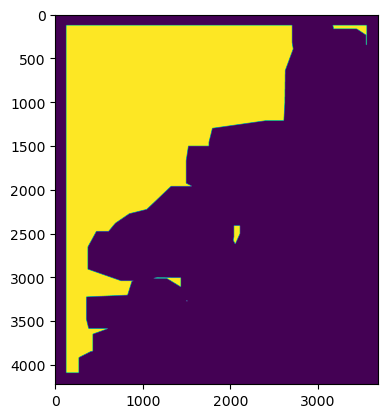

In [59]:
plt.imshow(broad_sin_glaciar_tif)

0
50
100
150
200
250
300
350
400
450
500
550
600
650
700
750
800
850
900
950


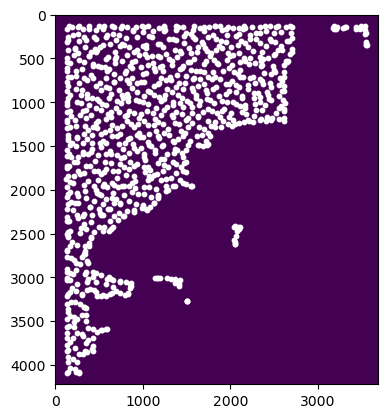

In [61]:
re_samples_sin_bite, re_samples_sin =generate_samples(broad_sin_glaciar_tif, 256, 1000, power=2)

plt.imshow(re_samples_sin_bite)

a = (re_samples_sin[:,0]+re_samples_sin[:,1])/2, (re_samples_sin[:,2]+re_samples_sin[:,3])/2
plt.scatter(a[1], a[0], color="white", s=10)

In [60]:
len(re_images_glaciar)

940

In [160]:
re_images_sin, re_masks_sin = sample_images(re_samples_sin, en_glaciar_tif, datasets)

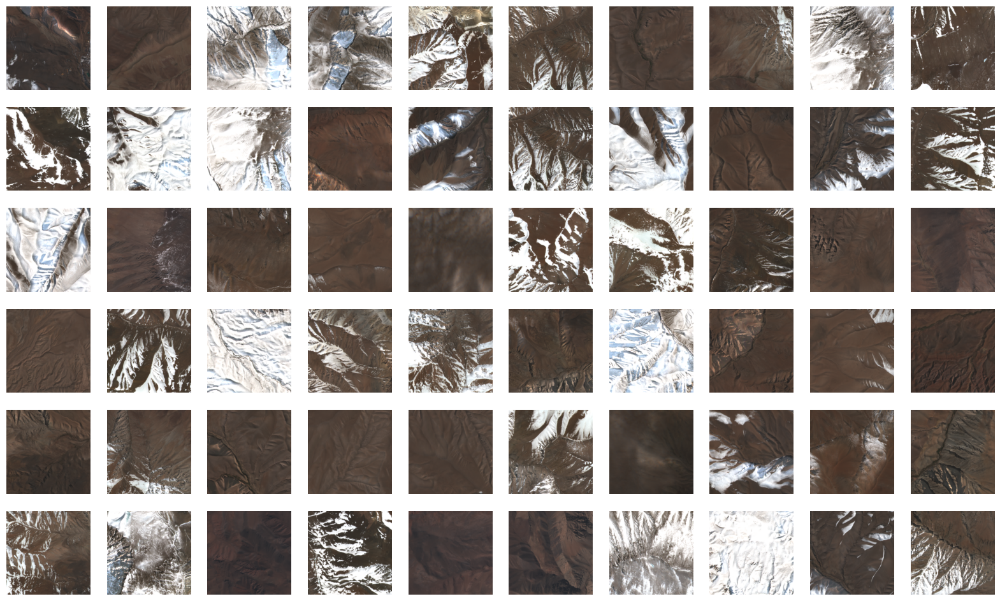

In [162]:
fig, axes = plt.subplots(6, 10, figsize = (20,12))
axes = axes.flatten()
#fig.tight_layout(h_pad=-1, w_pad=-8)
for ax, img in zip(axes, re_images_sin):
    ax.imshow(img)
    ax.axis("off")

In [163]:
import matplotlib

In [165]:
for i, img in enumerate(re_images_sin):
    img = np.clip(img, 0, 1)
    matplotlib.image.imsave(f'train/cordillera_{"0"*(3-len(str(i))) + str(i)}.png', img)

In [166]:
for i, img in enumerate(re_images_glaciar):
    img = np.clip(img, 0, 1)
    matplotlib.image.imsave(f'train/glaciarRoca_{"0"*(3-len(str(i))) + str(i)}.png', img)

In [168]:
for i, img in enumerate(re_masks_glaciar):
    img = np.clip(img, 0, 1)
    matplotlib.image.imsave(f'train/mask_{"0"*(3-len(str(i))) + str(i)}.png', -1*img, cmap = "Greys")